# Objective
* 20201111: 
    * Given daily returns for the last N days, we do prediction for the next N+H days, where H is the forecast horizon
    * Using xgboost
    * Date features are not used here
* 20210424:
    * Generate technical indicators as features
* 20210807:
    * Using day-to-day models

In [3551]:
import chart_studio.plotly as py
import math
import matplotlib
import numpy as np
import pandas as pd
import pickle
import pylab
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.offline as pyo
import scipy.stats as stats
import time

from collections import defaultdict
from datetime import date
from fastai.tabular import add_datepart
from matplotlib import pyplot as plt
from plotly.subplots import make_subplots
from pylab import rcParams
from sklearn.metrics import mean_squared_error
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm_notebook
from xgboost import XGBRegressor

%matplotlib inline

pyo.init_notebook_mode()

# py.sign_in(<user-name>, <access-key>) # sign in to plotly if you haven't done so

#### Input params ##################
folder = "./data/"
filename = "VTI_20130102_20181231.csv"

# Predicting on day 1008, date 2017-01-03 00:00:00
# Predicting on day 1050, date 2017-03-06 00:00:00
# Predicting on day 1092, date 2017-05-04 00:00:00
# Predicting on day 1134, date 2017-07-05 00:00:00
# Predicting on day 1176, date 2017-09-01 00:00:00
# Predicting on day 1218, date 2017-11-01 00:00:00
# Predicting on day 1260, date 2018-01-03 00:00:00
# Predicting on day 1302, date 2018-03-06 00:00:00
# Predicting on day 1344, date 2018-05-04 00:00:00
# Predicting on day 1386, date 2018-07-05 00:00:00
# Predicting on day 1428, date 2018-09-04 00:00:00
# Predicting on day 1470, date 2018-11-01 00:00:00

pred_date = '2017-01-03'        # Predict for this day, for the next H-1 days. Note indexing of days start from 0.

H = 21                         # Forecast horizon, in days. Note there are about 252 trading days in a year
train_size = 252*3             # Use 3 years of data as train set. Note there are about 252 trading days in a year
val_size = 252                 # Use 1 year of data as validation set
N = 10                         # for feature at day t, we use lags from t-1, t-2, ..., t-N as features

n_estimators = 100             # Number of boosted trees to fit. default = 100
max_depth = 3                  # Maximum tree depth for base learners. default = 3
learning_rate = 0.1            # Boosting learning rate (xgb’s “eta”). default = 0.1
min_child_weight = 1           # Minimum sum of instance weight(hessian) needed in a child. default = 1
subsample = 1                  # Subsample ratio of the training instance. default = 1
colsample_bytree = 1           # Subsample ratio of columns when constructing each tree. default = 1
colsample_bylevel = 1          # Subsample ratio of columns for each split, in each level. default = 1
gamma = 0                      # Minimum loss reduction required to make a further partition on a leaf node of the tree. default=0

model_seed = 100

fontsize = 14
ticklabelsize = 14

# Plotly colors
colors = [
    '#1f77b4',  # muted blue
    '#ff7f0e',  # safety orange
    '#2ca02c',  # cooked asparagus green
    '#d62728',  # brick red
    '#9467bd',  # muted purple
    '#8c564b',  # chestnut brown
    '#e377c2',  # raspberry yogurt pink
    '#7f7f7f',  # middle gray
    '#bcbd22',  # curry yellow-green
    '#17becf'   # blue-teal
]

####################################

train_val_size = train_size + val_size # Size of train+validation set
print("No. of days in train+validation set = " + str(train_val_size))

No. of days in train+validation set = 1008


In [3552]:
tic1 = time.time()

# Common functions

In [3553]:
def get_mape(y_true, y_pred): 
    """
    Compute mean absolute percentage error (MAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def get_wape(y_true, y_pred): 
    """
    Compute weighted absolute percentage error (WAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return sum(np.abs(y_true - y_pred)) / sum(y_true) * 100

def get_mae(a, b):
    """
    Comp mean absolute error e_t = E[|a_t - b_t|]. a and b can be lists.
    Returns a vector of len = len(a) = len(b)
    """
    return np.mean(abs(np.array(a)-np.array(b)))

def get_rmse(a, b):
    """
    Comp RMSE. a and b can be lists.
    Returns a scalar.
    """
    return math.sqrt(np.mean((np.array(a)-np.array(b))**2))

In [3554]:
def get_mov_avg_std(df, col, N):
    """
    Given a dataframe, get mean and std dev at timestep t using values from t-1, t-2, ..., t-N.
    Inputs
        df         : dataframe. Can be of any length.
        col        : name of the column you want to calculate mean and std dev
        N          : get mean and std dev at timestep t using values from t-1, t-2, ..., t-N
    Outputs
        df_out     : same as df but with additional column containing mean and std dev
    """
    mean_list = df[col].rolling(window = N, min_periods=1).mean() # len(mean_list) = len(df)
    std_list = df[col].rolling(window = N, min_periods=1).std()   # first value will be NaN, because normalized by N-1
    
    # Add one timestep to the predictions
    mean_list = np.concatenate((np.array([np.nan]), np.array(mean_list[:-1])))
    std_list = np.concatenate((np.array([np.nan]), np.array(std_list[:-1])))
    
    # Append mean_list to df
    df_out = df.copy()
    df_out[col + '_mean'] = mean_list
    df_out[col + '_std'] = std_list
    
    return df_out



def add_lags(df, N, lag_cols):
    """
    Add lags up to N number of days to use as features
    The lag columns are labelled as 'adj_close_lag_1', 'adj_close_lag_2', ... etc.
    """
    # Use lags up to N number of days to use as features
    df_w_lags = df.copy()
    df_w_lags.loc[:, 'order_day'] = [x for x in list(range(len(df)))] # Add a column 'order_day' to indicate the order of the rows by date
    merging_keys = ['order_day'] # merging_keys
    shift_range = [x+1 for x in range(N)]
    for shift in shift_range:
        train_shift = df_w_lags[merging_keys + lag_cols].copy()
    
        # E.g. order_day of 0 becomes 1, for shift = 1.
        # So when this is merged with order_day of 1 in df_w_lags, this will represent lag of 1.
        train_shift['order_day'] = train_shift['order_day'] + shift
    
        foo = lambda x: '{}_lag_{}'.format(x, shift) if x in lag_cols else x
        train_shift = train_shift.rename(columns=foo)

        df_w_lags = pd.merge(df_w_lags, train_shift, on=merging_keys, how='left') #.fillna(0)
    del train_shift
    
    return df_w_lags


def add_leads(df, N, lead_cols):
    """
    Add leads up to N number of days to use as targets
    The lead columns are labelled as 'adj_close_lead_1', 'adj_close_lead_2', ... etc.
    """
    # Add leads up to N number of days to use as targets
    df_w_leads = df.copy()
    df_w_leads.loc[:, 'order_day'] = [x for x in list(range(len(df)))] # Add a column 'order_day' to indicate the order of the rows by date
    merging_keys = ['order_day'] # merging_keys
    shift_range = [x+1 for x in range(N)]
    for shift in shift_range:
        train_shift = df_w_leads[merging_keys + lead_cols].copy()
    
        # E.g. order_day of N becomes N-1, for shift = 1.
        # So when this is merged with order_day of N-1 in df_w_leads, this will represent lead of 1.
        train_shift['order_day'] = train_shift['order_day'] - shift
    
        foo = lambda x: '{}_lead_{}'.format(x, shift) if x in lead_cols else x
        train_shift = train_shift.rename(columns=foo)

        df_w_leads = pd.merge(df_w_leads, train_shift, on=merging_keys, how='left') #.fillna(0)
    del train_shift
    
    return df_w_leads


## get_sma

In [3555]:
def get_sma(X, df):
    """
    Get features related to simple moving average
    Inputs
        X  : dataframe without the SMA features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional SMA features
    """
    
    # Simple moving average
    df['sma_10'] = df['adj_close'].rolling(window = 10).mean()
    df['sma_20'] = df['adj_close'].rolling(window = 20).mean()
    df['sma_50'] = df['adj_close'].rolling(window = 50).mean()
    df['sma_100'] = df['adj_close'].rolling(window = 100).mean()
    df['sma_200'] = df['adj_close'].rolling(window = 200).mean()

    # Get the sma on the previous day
    df['adj_close_lag_1'] = df['adj_close'].shift(1)
    df['sma_10_lag_1'] = df['sma_10'].shift(1)
    df['sma_20_lag_1'] = df['sma_20'].shift(1)
    df['sma_50_lag_1'] = df['sma_50'].shift(1)
    df['sma_100_lag_1'] = df['sma_100'].shift(1)
    df['sma_200_lag_1'] = df['sma_200'].shift(1)

    # Get above signals
    df['sma_above20'] = (df['adj_close'] > df['sma_20']).astype(int)
    df['sma_above50'] = (df['adj_close'] > df['sma_50']).astype(int)
    df['sma_above100'] = (df['adj_close'] > df['sma_100']).astype(int)
    df['sma_above200'] = (df['adj_close'] > df['sma_200']).astype(int)

    df['sma_10above20'] = (df['sma_10'] > df['sma_20']).astype(int)
    df['sma_10above50'] = (df['sma_10'] > df['sma_50']).astype(int)
    df['sma_10above100'] = (df['sma_10'] > df['sma_100']).astype(int)
    df['sma_10above200'] = (df['sma_10'] > df['sma_200']).astype(int)

    # Get bullish crossover signals
    df['sma_cut20'] = ((df['adj_close_lag_1'] < df['sma_20_lag_1']) & (df['sma_above20']==True)).astype(int)
    df['sma_cut50'] = ((df['adj_close_lag_1'] < df['sma_50_lag_1']) & (df['sma_above50']==True)).astype(int)
    df['sma_cut100'] = ((df['adj_close_lag_1'] < df['sma_100_lag_1']) & (df['sma_above100']==True)).astype(int)
    df['sma_cut200'] = ((df['adj_close_lag_1'] < df['sma_200_lag_1']) & (df['sma_above200']==True)).astype(int)

    df['sma_10cut20'] = ((df['sma_10_lag_1'] < df['sma_20_lag_1']) & (df['sma_10above20']==True)).astype(int)
    df['sma_10cut50'] = ((df['sma_10_lag_1'] < df['sma_50_lag_1']) & (df['sma_10above50']==True)).astype(int)
    df['sma_10cut100'] = ((df['sma_10_lag_1'] < df['sma_100_lag_1']) & (df['sma_10above100']==True)).astype(int)
    df['sma_10cut200'] = ((df['sma_10_lag_1'] < df['sma_200_lag_1']) & (df['sma_10above200']==True)).astype(int)

    # Get bearish crossover signals
    df['sma_cut20down'] = ((df['adj_close_lag_1'] > df['sma_20_lag_1']) & (df['adj_close'] < df['sma_20'])).astype(int)
    df['sma_cut50down'] = ((df['adj_close_lag_1'] > df['sma_50_lag_1']) & (df['adj_close'] < df['sma_50'])).astype(int)
    df['sma_cut100down'] = ((df['adj_close_lag_1'] > df['sma_100_lag_1']) & (df['adj_close'] < df['sma_100'])).astype(int)
    df['sma_cut200down'] = ((df['adj_close_lag_1'] > df['sma_200_lag_1']) & (df['adj_close'] < df['sma_200'])).astype(int)

    df['sma_10cut20down'] = ((df['sma_10_lag_1'] > df['sma_20_lag_1']) & (df['sma_10'] < df['sma_20'])).astype(int)
    df['sma_10cut50down'] = ((df['sma_10_lag_1'] > df['sma_50_lag_1']) & (df['sma_10'] < df['sma_50'])).astype(int)
    df['sma_10cut100down'] = ((df['sma_10_lag_1'] > df['sma_100_lag_1']) & (df['sma_10'] < df['sma_100'])).astype(int)
    df['sma_10cut200down'] = ((df['sma_10_lag_1'] > df['sma_200_lag_1']) & (df['sma_10'] < df['sma_200'])).astype(int)
    
    tech_features = [   'sma_above20',
                        'sma_above50',
                        'sma_above100',
                        'sma_above200',
                        'sma_10above20',
                        'sma_10above50',
                        'sma_10above100',
                        'sma_10above200',
                        'sma_cut20',
                        'sma_cut50',
                        'sma_cut100',
                        'sma_cut200',
                        'sma_10cut20',
                        'sma_10cut50',
                        'sma_10cut100',
                        'sma_10cut200',
                        'sma_cut20down',
                        'sma_cut50down',
                        'sma_cut100down',
                        'sma_cut200down',
                        'sma_10cut20down',
                        'sma_10cut50down',
                        'sma_10cut100down',
                        'sma_10cut200down'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]
    
    return pd.concat([X, features_df], axis=1)

## get_ema

In [3556]:
def get_ema(X, df):
    """
    Get features related to exponential moving average
    Inputs
        X  : dataframe without the EMA features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional EMA features
    """
    
    # Exponential moving average
    df['ema_10'] = df['adj_close'].ewm(span = 10, adjust=False).mean()
    df['ema_20'] = df['adj_close'].ewm(span = 20, adjust=False).mean()
    df['ema_50'] = df['adj_close'].ewm(span = 50, adjust=False).mean()
    df['ema_100'] = df['adj_close'].ewm(span = 100, adjust=False).mean()
    df['ema_200'] = df['adj_close'].ewm(span = 200, adjust=False).mean()

    # Get the ema on the previous day
    df['adj_close_lag_1'] = df['adj_close'].shift(1)
    df['ema_10_lag_1'] = df['ema_10'].shift(1)
    df['ema_20_lag_1'] = df['ema_20'].shift(1)
    df['ema_50_lag_1'] = df['ema_50'].shift(1)
    df['ema_100_lag_1'] = df['ema_100'].shift(1)
    df['ema_200_lag_1'] = df['ema_200'].shift(1)

    # Get above signals
    df['ema_above20'] = (df['adj_close'] > df['ema_20']).astype(int)
    df['ema_above50'] = (df['adj_close'] > df['ema_50']).astype(int)
    df['ema_above100'] = (df['adj_close'] > df['ema_100']).astype(int)
    df['ema_above200'] = (df['adj_close'] > df['ema_200']).astype(int)

    df['ema_10above20'] = (df['ema_10'] > df['ema_20']).astype(int)
    df['ema_10above50'] = (df['ema_10'] > df['ema_50']).astype(int)
    df['ema_10above100'] = (df['ema_10'] > df['ema_100']).astype(int)
    df['ema_10above200'] = (df['ema_10'] > df['ema_200']).astype(int)

    # Get bullish crossover signals
    df['ema_cut20'] = ((df['adj_close_lag_1'] < df['ema_20_lag_1']) & (df['ema_above20']==True)).astype(int)
    df['ema_cut50'] = ((df['adj_close_lag_1'] < df['ema_50_lag_1']) & (df['ema_above50']==True)).astype(int)
    df['ema_cut100'] = ((df['adj_close_lag_1'] < df['ema_100_lag_1']) & (df['ema_above100']==True)).astype(int)
    df['ema_cut200'] = ((df['adj_close_lag_1'] < df['ema_200_lag_1']) & (df['ema_above200']==True)).astype(int)

    df['ema_10cut20'] = ((df['ema_10_lag_1'] < df['ema_20_lag_1']) & (df['ema_10above20']==True)).astype(int)
    df['ema_10cut50'] = ((df['ema_10_lag_1'] < df['ema_50_lag_1']) & (df['ema_10above50']==True)).astype(int)
    df['ema_10cut100'] = ((df['ema_10_lag_1'] < df['ema_100_lag_1']) & (df['ema_10above100']==True)).astype(int)
    df['ema_10cut200'] = ((df['ema_10_lag_1'] < df['ema_200_lag_1']) & (df['ema_10above200']==True)).astype(int)

    # Get bearish crossover signals
    df['ema_cut20down'] = ((df['adj_close_lag_1'] > df['ema_20_lag_1']) & (df['adj_close'] < df['ema_20'])).astype(int)
    df['ema_cut50down'] = ((df['adj_close_lag_1'] > df['ema_50_lag_1']) & (df['adj_close'] < df['ema_50'])).astype(int)
    df['ema_cut100down'] = ((df['adj_close_lag_1'] > df['ema_100_lag_1']) & (df['adj_close'] < df['ema_100'])).astype(int)
    df['ema_cut200down'] = ((df['adj_close_lag_1'] > df['ema_200_lag_1']) & (df['adj_close'] < df['ema_200'])).astype(int)

    df['ema_10cut20down'] = ((df['ema_10_lag_1'] > df['ema_20_lag_1']) & (df['ema_10'] < df['ema_20'])).astype(int)
    df['ema_10cut50down'] = ((df['ema_10_lag_1'] > df['ema_50_lag_1']) & (df['ema_10'] < df['ema_50'])).astype(int)
    df['ema_10cut100down'] = ((df['ema_10_lag_1'] > df['ema_100_lag_1']) & (df['ema_10'] < df['ema_100'])).astype(int)
    df['ema_10cut200down'] = ((df['ema_10_lag_1'] > df['ema_200_lag_1']) & (df['ema_10'] < df['ema_200'])).astype(int)
    
    tech_features = [   
                        'ema_above20',
                        'ema_above50',
                        'ema_above100',
                        'ema_above200',
                        'ema_10above20',
                        'ema_10above50',
                        'ema_10above100',
                        'ema_10above200',
                        'ema_cut20',
                        'ema_cut50',
                        'ema_cut100',
                        'ema_cut200',
                        'ema_10cut20',
                        'ema_10cut50',
                        'ema_10cut100',
                        'ema_10cut200',
                        'ema_cut20down',
                        'ema_cut50down',
                        'ema_cut100down',
                        'ema_cut200down',
                        'ema_10cut20down',
                        'ema_10cut50down',
                        'ema_10cut100down',
                        'ema_10cut200down'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

## get_macd

In [3557]:
def get_macd(X, df):
    """
    Get features related to exponential moving average
    Inputs
        X  : dataframe without the MACD features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional MACD features
    """

    # Exponential moving average
    df['ema_12'] = df['adj_close'].ewm(span=12, adjust=False).mean()
    df['ema_26'] = df['adj_close'].ewm(span=26, adjust=False).mean()

    # MACD
    df['macd'] = df['ema_12'] - df['ema_26']
    df['macd_signal'] = df['macd'].ewm(span=9, adjust=False).mean()

    # Get the macd on the previous day
    df['macd_lag_1'] = df['macd'].shift(1)
    df['macd_signal_lag_1'] = df['macd_signal'].shift(1)

    # Get bullish crossover signals
    df['macd_crossover'] = ((df['macd_lag_1'] < df['macd_signal_lag_1']) & \
                            (df['macd'] > df['macd_signal'])).astype(int)
    
    # Get bearish crossover signals
    df['macd_crossoverdown'] = ((df['macd_lag_1'] > df['macd_signal_lag_1']) & \
                        (df['macd'] < df['macd_signal'])).astype(int)


    tech_features = [   
                        'macd',
                        'macd_crossover',
                        'macd_crossoverdown'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

## get_stochastic_osc

In [3558]:
def get_stochastic_osc(X, df):
    """
    Get features related to stochastic oscillator
    Inputs
        X  : dataframe without the stochastic oscillator features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional stochastic oscillator features
    """

    # Generate fast and slow stochastic oscillators
    df['lowest_14'] = df['adj_close'].rolling(window = 14).min()
    df['highest_14'] = df['adj_close'].rolling(window = 14).max()
    df['stochastic_fast'] = 100.0*(df['adj_close'] - df['lowest_14'])/(df['highest_14'] - df['lowest_14'])
    df['stochastic_slow'] = df['stochastic_fast'].rolling(window = 3).mean()

    # Get the stochastics on the previous day
    df['stochastic_fast_lag_1'] = df['stochastic_fast'].shift(1)
    df['stochastic_slow_lag_1'] = df['stochastic_slow'].shift(1)

    # Get bullish crossover signals
    df['stochastic_fastcutslow'] = ((df['stochastic_fast_lag_1'] < df['stochastic_slow_lag_1']) & \
                                    (df['stochastic_fast'] > df['stochastic_slow'])).astype(int)

    # Get bearish crossover signals
    df['stochastic_fastcutslowdown'] = ((df['stochastic_fast_lag_1'] > df['stochastic_slow_lag_1']) & \
                                        (df['stochastic_fast'] < df['stochastic_slow'])).astype(int)
    
    # Get overbought/oversold signals
    df['stochastic_overs'] = (df['stochastic_fast'] < 20).astype(int)
    df['stochastic_overb'] = (df['stochastic_fast'] > 80).astype(int)

    tech_features = [   
                        'stochastic_fast',
                        'stochastic_slow',
                        'stochastic_fastcutslow',
                        'stochastic_fastcutslowdown',
                        'stochastic_overs',
                        'stochastic_overb'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

## get_rsi

In [3559]:
def get_rsi(X, df):
    """
    Get features related to rsi
    Inputs
        X  : dataframe without the rsi features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional rsi features
    """
    
    # Get gain and loss columns
    df['gain'] = df['daily_ret']
    df.loc[df['gain']<0, 'gain'] = 0

    df['loss'] = df['daily_ret']
    df.loc[df['loss']>0, 'loss'] = 0
    df['loss'] = abs(df['loss'])
          
    avg_gain = ( float(df['avg_gain'][-2:-1])*13 + float(df['gain'][-1:]) ) / 14
    avg_loss = ( float(df['avg_loss'][-2:-1])*13 + float(df['loss'][-1:]) ) / 14
    
    # Assign the values to df
    df.at[df.index[-1], 'avg_gain'] = avg_gain
    df.at[df.index[-1], 'avg_loss'] = avg_loss
    
    rsi = 100 - 100/(1+(avg_gain/avg_loss))
    rsi_ob = int(rsi > 70)
    rsi_os = int(rsi < 30)

    features_df = pd.DataFrame({'rsi_lag_1': [rsi],
                                'rsi_ob_lag_1': [rsi_ob],
                                'rsi_os_lag_1': [rsi_os]
                               })

    return pd.concat([X, features_df], axis=1)

## get_bollinger_bands

In [3560]:
def get_bollinger_bands(X, df):
    """
    Get features related to bollinger bands
    Inputs
        X  : dataframe without the bollinger band features
        df : dataframe containing 'adj_close' column. To generate features for the last row in this dataframe.
    Outputs
        X  : X with additional bollinger band features
    """
    
    df['std_20'] = df['adj_close'].rolling(window = 20).std()
    df['bollinger_upp'] = df['sma_20'] + 2*df['std_20']
    df['bollinger_low'] = df['sma_20'] - 2*df['std_20']

    # Get dist between bollinger bands and the price
    df['bollinger_upp_dist'] = df['bollinger_upp'] - df['adj_close']
    df['bollinger_low_dist'] = df['adj_close'] - df['bollinger_low']

    # Get signals
    df['bollinger_ob'] = (df['adj_close'] > df['bollinger_upp']).astype(int)
    df['bollinger_os'] = (df['adj_close'] < df['bollinger_low']).astype(int)

    tech_features = [   
                        'bollinger_upp_dist',
                        'bollinger_low_dist',
                        'bollinger_ob',
                        'bollinger_os'
                    ]
    
    features_df = df[tech_features][-1:].reset_index(drop=True)
    features_df.columns = [item+'_lag_1' for item in tech_features]

    return pd.concat([X, features_df], axis=1)

## pred_xgboost

In [3561]:
def pred_xgboost(model, train_adj_close, X_test_1_pred, N, H, prev_targets):
    """
    Do recursive forecasting using xgboost
    Inputs
        model              : the xgboost model
        train_adj_close    : dataframe with a few columns including adj_close
        X_test_1_pred      : first row of test set features
        N                  : for feature at day t, we use lags from t-1, t-2, ..., t-N as features
        H                  : forecast horizon
        prev_targets       : numpy array. If predicting daily_ret at time t, 
                             prev_targets will contain the N daily_ret values at t-1, t-2, ..., t-N
    Outputs
        Times series of adj_close predictions. Numpy array of shape (H,).
    """
    forecast = prev_targets.copy()
    
    # Do prediction
    est = model.predict(X_test_1_pred)
        
    # Concatenate the prediction
    forecast = np.concatenate([forecast, est])
    
    # Convert back to price
    train_adj_close = train_adj_close.append({'adj_close': (est[0]/100+1)*float(train_adj_close['adj_close'][-1:]),
                                              'daily_ret': est[0]
                                             }, 
                                             ignore_index=True)


    for n in range(1, H):
        
        # Create the features dataframe
        X = defaultdict(list)
        for n in range(N,0,-1):
            X['daily_ret_lag_'+str(n)] = [forecast[-n]]
        X = pd.DataFrame(X)
        
        # Add SMA features
        X = get_sma(X, train_adj_close)
        
        # Add EMA features
        X = get_ema(X, train_adj_close)
        
        # Add MACD features
        X = get_macd(X, train_adj_close)

        # Add stochastic osc features
        X = get_stochastic_osc(X, train_adj_close)
        
        # Add rsi features
        X = get_rsi(X, train_adj_close)

        # Add bollinger band features
        X = get_bollinger_bands(X, train_adj_close)
        
        # Do prediction
        est = model.predict(X)
        
        # Concatenate the prediction
        forecast = np.concatenate([forecast, est])
        
        # Convert back to price
        train_adj_close = train_adj_close.append({'adj_close': (est[0]/100+1)*float(train_adj_close['adj_close'][-1:]),
                                                  'daily_ret': est[0]}, 
                                                 ignore_index=True)

    return list(train_adj_close['adj_close'][-H:])

## train_pred_eval_model

In [3562]:
def train_pred_eval_model(X_train,
                          y_train,
                          X_test,
                          y_test,
                          test_adj_close,
                          prev_target,
                          N,
                          H,
                          seed=100,
                          n_estimators=100,
                          max_depth=3,
                          learning_rate=0.1,
                          min_child_weight=1,
                          subsample=1,
                          colsample_bytree=1,
                          colsample_bylevel=1,
                          gamma=0):
    '''
    Train model, do prediction, and do evaluation
    Use XGBoost here.
    Inputs
        X_train            : features for training
        y_train            : target for training
        X_test             : features for test
        y_test             : target for test
        test_adj_close     : numpy array. Target for test. This is adjusted close, not daily returns
        prev_target        : this is the last target from the train dataframe
        N                  : for feature at day t, we use lags from t-1, t-2, ..., t-N as features
        H                  : forecast horizon
        seed               : model seed
        n_estimators       : number of boosted trees to fit
        max_depth          : maximum tree depth for base learners
        learning_rate      : boosting learning rate (xgb’s “eta”)
        min_child_weight   : minimum sum of instance weight(hessian) needed in a child
        subsample          : subsample ratio of the training instance
        colsample_bytree   : subsample ratio of columns when constructing each tree
        colsample_bylevel  : subsample ratio of columns for each split, in each level
        gamma              : 
    Outputs
        rmse               : root mean square error of y_test and est
        mape               : mean absolute percentage error of y_test and est
        mae                : mean absolute error of y_test and est
        est                : predicted values. Same length as y_test
    '''

    model = XGBRegressor(objective ='reg:squarederror',
                         seed=model_seed,
                         n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         subsample=subsample,
                         colsample_bytree=colsample_bytree,
                         colsample_bylevel=colsample_bylevel,
                         gamma=gamma)
    
    # Train the model
    multioutputregressor = MultiOutputRegressor(model).fit(X_train, y_train)
    
    # Get predicted labels 
    est = multioutputregressor.predict(X_test)
    est = est[0]

    # Convert back to price
    est_adj_close = []
    prev_tg = prev_target
    for n in range(H):
        est_adj_close.append((est[n]/100+1)*prev_tg)
        prev_tg = (est[n]/100+1)*prev_tg

    # Calculate RMSE, MAPE, MAE
    rmse = get_rmse(test_adj_close, est_adj_close)
    mape = get_mape(test_adj_close, est_adj_close)
    mae = get_mae(test_adj_close, est_adj_close)
    
    return rmse, mape, mae, est_adj_close, multioutputregressor.estimators_[0].feature_importances_

## multioutputreg_splitXy

In [3563]:
def multioutputreg_splitXy(df, 
                           features, 
                           target,
                           H):
    """
    Given a dataframe where each row is one sample, rearrange it to output X and y
    Input
        df       : len(df) = num_samples
        features : list of feature names
        target   : e.g. 'daily_ret'
        H        : forecast horizon
    Output
        X : dataframe of size (num_samples-H+1, num_features)
        y : dataframe of size (num_samples-H+1, H). Each row represents the target samples of forecast horizon H 
    """
    # Add leads for target
    df_w_leads = add_leads(df, H-1, [target])
    
    target_w_leads = [target]
    for n in range(H-1):
        target_w_leads.append(target+"_lead_"+str(n+1))

    X = df_w_leads[:-(H-1)][features] # the last H-1 rows contains NaNs
    y = df_w_leads[:-(H-1)][target_w_leads] # the last H-1 rows contains NaNs
    
    return X, y

## get_error_metrics

In [3564]:
def get_error_metrics(df,
                      train_size,
                      target,
                      N,
                      tech_indicators,
                      H,
                      seed=100,
                      n_estimators=100,
                      max_depth=3,
                      learning_rate=0.1,
                      min_child_weight=1,
                      subsample=1,
                      colsample_bytree=1,
                      colsample_bylevel=1,
                      gamma=0):
    """
    Given a series consisting of both train+validation, do predictions of forecast horizon H on the validation set, 
    at H/2 intervals.
    Inputs
        df                 : train + val dataframe. len(df) = train_size + val_size
        train_size         : size of train set
        target             : e.g. 'daily_ret'
        N                  : for feature at day t, we use lags from t-1, t-2, ..., t-N as features
        tech_indicators    : list of technical indicators in the feature list
        H                  : forecast horizon
        seed               : model seed
        n_estimators       : number of boosted trees to fit
        max_depth          : maximum tree depth for base learners
        learning_rate      : boosting learning rate (xgb’s “eta”)
        min_child_weight   : minimum sum of instance weight(hessian) needed in a child
        subsample          : subsample ratio of the training instance
        colsample_bytree   : subsample ratio of columns when constructing each tree
        colsample_bylevel  : subsample ratio of columns for each split, in each level
        gamma              : 

    Outputs
        mean of rmse, mean of mape, mean of mae, dictionary of predictions
    """
    rmse_list = [] # root mean square error
    mape_list = [] # mean absolute percentage error
    mae_list = []  # mean absolute error
    preds_dict = {}
    
    # Add lags up to N number of days to use as features
    df = add_lags(df, N, [target])
    
    # Add lags for technical indicators
    df = add_lags(df, 1, tech_indicators)
    
    # Remove columns
    df.drop(tech_indicators, axis=1, inplace=True)
    
    features = []
    for n in range(N,0,-1):
        features.append(target+"_lag_"+str(n))
        
    features = features+[item+'_lag_1' for item in tech_indicators]
    
    for i in range(train_size, len(df)-H+1, int(H/2)):
        
        # Split into train and test
        train = df[i-train_size:i].copy()
        test = df[i:i+H].copy()
    
        # Drop the NaNs in train
        train.dropna(axis=0, how='any', inplace=True)
        
        # Split into X and y
        X_train, y_train = multioutputreg_splitXy(train, features, target, H)
        X_test, y_test = multioutputreg_splitXy(test, features, target, H)
        
#         X_test_1_pred = test.head(1)[features]
        test_adj_close = test['adj_close']
#         train_adj_close = train[['adj_close', 'daily_ret', 'avg_gain', 'avg_loss']]
#         prev_targets = train[-N:][target].to_numpy()
        prev_target = train[-1:]['adj_close'].values[0]
                
        rmse, mape, mae, est, feature_importances = train_pred_eval_model(X_train,
                                                     y_train,
                                                     X_test,
                                                     y_test,
                                                     test_adj_close,
                                                     prev_target,
                                                     N,
                                                     H,
                                                     seed=seed,
                                                     n_estimators=n_estimators,
                                                     max_depth=max_depth,
                                                     learning_rate=learning_rate,
                                                     min_child_weight=min_child_weight,
                                                     subsample=subsample,
                                                     colsample_bytree=colsample_bytree,
                                                     colsample_bylevel=colsample_bylevel,
                                                     gamma=gamma)
        
        rmse_list.append(rmse)
        mape_list.append(mape)
        mae_list.append(mae)
        preds_dict[i] = est
    
    return np.mean(rmse_list), np.mean(mape_list), np.mean(mae_list), preds_dict, feature_importances, features 

# Load data

In [3565]:
df = pd.read_csv(folder+filename, sep = ",")

# Convert Date column to datetime
df.loc[:, 'Date'] = pd.to_datetime(df['Date'],format='%Y-%m-%d')

# Change all column headings to be lower case, and remove spacing
df.columns = [str(x).lower().replace(' ', '_') for x in df.columns]

# Sort by datetime
df.sort_values(by='date', inplace=True, ascending=True)

df.head(10)

,date,open,high,low,close,adj_close,volume
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900
5,2013-01-09,75.190002,75.410004,75.110001,75.239998,67.086937,1421900
6,2013-01-10,75.620003,75.769997,75.220001,75.760002,67.550591,1403700
7,2013-01-11,75.760002,75.800003,75.510002,75.769997,67.559486,1248500
8,2013-01-14,75.750000,75.800003,75.440002,75.690002,67.488159,2745100
9,2013-01-15,75.400002,75.889999,75.339996,75.830002,67.612984,1109100


In [3566]:
# Create returns column
df['daily_ret'] = 100.0 * ((df['adj_close'] / df['adj_close'].shift(1)) - 1)
df

,date,open,high,low,close,adj_close,volume,daily_ret
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901
...,...,...,...,...,...,...,...,...
1504,2018-12-21,126.510002,127.970001,123.120003,123.489998,122.768997,13605000,-2.124119
1505,2018-12-24,121.900002,122.540001,119.669998,119.699997,119.699997,14488500,-2.499817
1506,2018-12-26,120.339996,125.519997,119.349998,125.459999,125.459999,12512300,4.812032
1507,2018-12-27,123.760002,126.589996,121.910004,126.589996,126.589996,16128500,0.900683


In [3567]:
# Generate Gaussian curve to fit the daily returns
mu = df['daily_ret'].mean()
std = df['daily_ret'].std()
x = np.arange(df['daily_ret'].min(), df['daily_ret'].max(), 0.001)
y = [1/math.sqrt(2*math.pi)/std*math.exp(-((i-mu)**2)/2/(std**2)) for i in x]
gauss_df = pd.DataFrame({'x':x, 'y':y})
print("meam = " + str(mu) + ", std dev = " + str(std))

meam = 0.04543338844842776, std dev = 0.8134088128601789


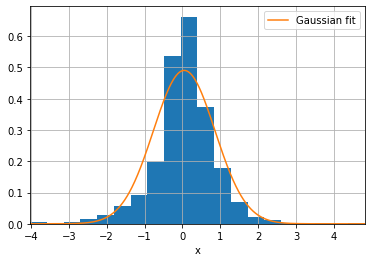

In [3568]:
# Plot histogram of the daily returns
ax = df['daily_ret'].hist(bins=20, density=True)
gauss_df.plot(x='x', y='y', grid=True, ax=ax)
plt.legend(['Gaussian fit'])

In [3569]:
fig = ff.create_distplot([np.array(df['daily_ret'][1:])], 
                         ['distplot'], 
                         bin_size=.1,
                         curve_type='normal', # override default 'kde'
                         )

# Add title
fig.update_layout(title_text='Distplot of daily returns with Normal Distribution')
fig.show()

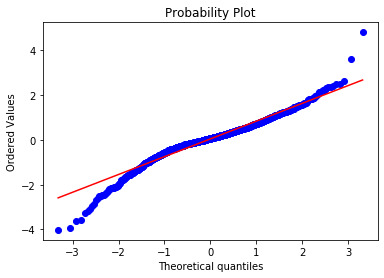

In [3570]:
# Plot QQ plot
stats.probplot(df['daily_ret'][1:], dist="norm", plot=pylab)
pylab.show()

Looks mostly Gaussian, except for the extreme values

In [3571]:
# Plot with plotly
data = [go.Scatter(
            x = df['date'],
            y = df['adj_close'],
            mode = 'lines')]

layout = dict(xaxis = dict(title = 'date'),
              yaxis = dict(title = 'USD'))

fig = dict(data=data, layout=layout)
pyo.iplot(fig, filename=filename)

# Feature Engineering

## Simple Moving Average

In [3572]:
# Simple moving average
df['sma_10'] = df['adj_close'].rolling(window = 10).mean()
df['sma_20'] = df['adj_close'].rolling(window = 20).mean()
df['sma_50'] = df['adj_close'].rolling(window = 50).mean()
df['sma_100'] = df['adj_close'].rolling(window = 100).mean()
df['sma_200'] = df['adj_close'].rolling(window = 200).mean()

# Get the sma on the previous day
df['adj_close_lag_1'] = df['adj_close'].shift(1)
df['sma_10_lag_1'] = df['sma_10'].shift(1)
df['sma_20_lag_1'] = df['sma_20'].shift(1)
df['sma_50_lag_1'] = df['sma_50'].shift(1)
df['sma_100_lag_1'] = df['sma_100'].shift(1)
df['sma_200_lag_1'] = df['sma_200'].shift(1)

# Get above signals
df['sma_above20'] = (df['adj_close'] > df['sma_20']).astype(int)
df['sma_above50'] = (df['adj_close'] > df['sma_50']).astype(int)
df['sma_above100'] = (df['adj_close'] > df['sma_100']).astype(int)
df['sma_above200'] = (df['adj_close'] > df['sma_200']).astype(int)

df['sma_10above20'] = (df['sma_10'] > df['sma_20']).astype(int)
df['sma_10above50'] = (df['sma_10'] > df['sma_50']).astype(int)
df['sma_10above100'] = (df['sma_10'] > df['sma_100']).astype(int)
df['sma_10above200'] = (df['sma_10'] > df['sma_200']).astype(int)

# Get bullish crossover signals
df['sma_cut20'] = ((df['adj_close_lag_1'] < df['sma_20_lag_1']) & (df['sma_above20']==True)).astype(int)
df['sma_cut50'] = ((df['adj_close_lag_1'] < df['sma_50_lag_1']) & (df['sma_above50']==True)).astype(int)
df['sma_cut100'] = ((df['adj_close_lag_1'] < df['sma_100_lag_1']) & (df['sma_above100']==True)).astype(int)
df['sma_cut200'] = ((df['adj_close_lag_1'] < df['sma_200_lag_1']) & (df['sma_above200']==True)).astype(int)

df['sma_10cut20'] = ((df['sma_10_lag_1'] < df['sma_20_lag_1']) & (df['sma_10above20']==True)).astype(int)
df['sma_10cut50'] = ((df['sma_10_lag_1'] < df['sma_50_lag_1']) & (df['sma_10above50']==True)).astype(int)
df['sma_10cut100'] = ((df['sma_10_lag_1'] < df['sma_100_lag_1']) & (df['sma_10above100']==True)).astype(int)
df['sma_10cut200'] = ((df['sma_10_lag_1'] < df['sma_200_lag_1']) & (df['sma_10above200']==True)).astype(int)

# Get bearish crossover signals
df['sma_cut20down'] = ((df['adj_close_lag_1'] > df['sma_20_lag_1']) & (df['adj_close'] < df['sma_20'])).astype(int)
df['sma_cut50down'] = ((df['adj_close_lag_1'] > df['sma_50_lag_1']) & (df['adj_close'] < df['sma_50'])).astype(int)
df['sma_cut100down'] = ((df['adj_close_lag_1'] > df['sma_100_lag_1']) & (df['adj_close'] < df['sma_100'])).astype(int)
df['sma_cut200down'] = ((df['adj_close_lag_1'] > df['sma_200_lag_1']) & (df['adj_close'] < df['sma_200'])).astype(int)

df['sma_10cut20down'] = ((df['sma_10_lag_1'] > df['sma_20_lag_1']) & (df['sma_10'] < df['sma_20'])).astype(int)
df['sma_10cut50down'] = ((df['sma_10_lag_1'] > df['sma_50_lag_1']) & (df['sma_10'] < df['sma_50'])).astype(int)
df['sma_10cut100down'] = ((df['sma_10_lag_1'] > df['sma_100_lag_1']) & (df['sma_10'] < df['sma_100'])).astype(int)
df['sma_10cut200down'] = ((df['sma_10_lag_1'] > df['sma_200_lag_1']) & (df['sma_10'] < df['sma_200'])).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_10,sma_20,...,sma_10cut100,sma_10cut200,sma_cut20down,sma_cut50down,sma_cut100down,sma_cut200down,sma_10cut20down,sma_10cut50down,sma_10cut100down,sma_10cut200down
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
5,2013-01-09,75.190002,75.410004,75.110001,75.239998,67.086937,1421900,0.306627,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
6,2013-01-10,75.620003,75.769997,75.220001,75.760002,67.550591,1403700,0.691124,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
7,2013-01-11,75.760002,75.800003,75.510002,75.769997,67.559486,1248500,0.013168,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
8,2013-01-14,75.750000,75.800003,75.440002,75.690002,67.488159,2745100,-0.105577,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
9,2013-01-15,75.400002,75.889999,75.339996,75.830002,67.612984,1109100,0.184958,67.237615,NaN,...,0,0,0,0,0,0,0,0,0,0


In [3573]:
signals = df[df['sma_10cut200']==1]

# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_10'], 
                         mode='lines', 
                         name='sma_10', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_20'], 
                         mode='lines', 
                         name='sma_20', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_50'], 
                         mode='lines', 
                         name='sma_50', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_100'], 
                         mode='lines', 
                         name='sma_100', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_200'], 
                         mode='lines', 
                         name='sma_200', 
                         ))

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ))
    n = n+1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

# py.iplot(fig, filename='VTI_20130102_20181231_sma')

In [3574]:
# Del unneccesary cols
df.drop(['sma_10', 'sma_50', 'sma_100', 'sma_200',
         'sma_10_lag_1', 'sma_20_lag_1', 'sma_50_lag_1', 'sma_100_lag_1', 'sma_200_lag_1'], axis=1, inplace=True)

## Exponential Moving Average

In [3575]:
# Exponential moving average
df['ema_10'] = df['adj_close'].ewm(span = 10, adjust=False).mean()
df['ema_20'] = df['adj_close'].ewm(span = 20, adjust=False).mean()
df['ema_50'] = df['adj_close'].ewm(span = 50, adjust=False).mean()
df['ema_100'] = df['adj_close'].ewm(span = 100, adjust=False).mean()
df['ema_200'] = df['adj_close'].ewm(span = 200, adjust=False).mean()

# Get the ema on the previous day
df['adj_close_lag_1'] = df['adj_close'].shift(1)
df['ema_10_lag_1'] = df['ema_10'].shift(1)
df['ema_20_lag_1'] = df['ema_20'].shift(1)
df['ema_50_lag_1'] = df['ema_50'].shift(1)
df['ema_100_lag_1'] = df['ema_100'].shift(1)
df['ema_200_lag_1'] = df['ema_200'].shift(1)

# Get above signals
df['ema_above20'] = (df['adj_close'] > df['ema_20']).astype(int)
df['ema_above50'] = (df['adj_close'] > df['ema_50']).astype(int)
df['ema_above100'] = (df['adj_close'] > df['ema_100']).astype(int)
df['ema_above200'] = (df['adj_close'] > df['ema_200']).astype(int)

df['ema_10above20'] = (df['ema_10'] > df['ema_20']).astype(int)
df['ema_10above50'] = (df['ema_10'] > df['ema_50']).astype(int)
df['ema_10above100'] = (df['ema_10'] > df['ema_100']).astype(int)
df['ema_10above200'] = (df['ema_10'] > df['ema_200']).astype(int)

# Get bullish crossover signals
df['ema_cut20'] = ((df['adj_close_lag_1'] < df['ema_20_lag_1']) & (df['ema_above20']==True)).astype(int)
df['ema_cut50'] = ((df['adj_close_lag_1'] < df['ema_50_lag_1']) & (df['ema_above50']==True)).astype(int)
df['ema_cut100'] = ((df['adj_close_lag_1'] < df['ema_100_lag_1']) & (df['ema_above100']==True)).astype(int)
df['ema_cut200'] = ((df['adj_close_lag_1'] < df['ema_200_lag_1']) & (df['ema_above200']==True)).astype(int)

df['ema_10cut20'] = ((df['ema_10_lag_1'] < df['ema_20_lag_1']) & (df['ema_10above20']==True)).astype(int)
df['ema_10cut50'] = ((df['ema_10_lag_1'] < df['ema_50_lag_1']) & (df['ema_10above50']==True)).astype(int)
df['ema_10cut100'] = ((df['ema_10_lag_1'] < df['ema_100_lag_1']) & (df['ema_10above100']==True)).astype(int)
df['ema_10cut200'] = ((df['ema_10_lag_1'] < df['ema_200_lag_1']) & (df['ema_10above200']==True)).astype(int)

# Get bearish crossover signals
df['ema_cut20down'] = ((df['adj_close_lag_1'] > df['ema_20_lag_1']) & (df['adj_close'] < df['ema_20'])).astype(int)
df['ema_cut50down'] = ((df['adj_close_lag_1'] > df['ema_50_lag_1']) & (df['adj_close'] < df['ema_50'])).astype(int)
df['ema_cut100down'] = ((df['adj_close_lag_1'] > df['ema_100_lag_1']) & (df['adj_close'] < df['ema_100'])).astype(int)
df['ema_cut200down'] = ((df['adj_close_lag_1'] > df['ema_200_lag_1']) & (df['adj_close'] < df['ema_200'])).astype(int)

df['ema_10cut20down'] = ((df['ema_10_lag_1'] > df['ema_20_lag_1']) & (df['ema_10'] < df['ema_20'])).astype(int)
df['ema_10cut50down'] = ((df['ema_10_lag_1'] > df['ema_50_lag_1']) & (df['ema_10'] < df['ema_50'])).astype(int)
df['ema_10cut100down'] = ((df['ema_10_lag_1'] > df['ema_100_lag_1']) & (df['ema_10'] < df['ema_100'])).astype(int)
df['ema_10cut200down'] = ((df['ema_10_lag_1'] > df['ema_200_lag_1']) & (df['ema_10'] < df['ema_200'])).astype(int)

df

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,ema_10cut100,ema_10cut200,ema_cut20down,ema_cut50down,ema_cut100down,ema_cut200down,ema_10cut20down,ema_10cut50down,ema_10cut100down,ema_10cut200down
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,66.997757,...,0,0,0,0,0,0,0,0,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,66.899689,...,1,1,0,0,0,0,0,0,0,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,67.238510,...,0,0,0,0,0,0,0,0,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,67.060173,...,0,0,1,1,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,2018-12-21,126.510002,127.970001,123.120003,123.489998,122.768997,13605000,-2.124119,134.177005,125.433350,...,0,0,0,0,0,0,0,0,0,0
1505,2018-12-24,121.900002,122.540001,119.669998,119.699997,119.699997,14488500,-2.499817,133.444952,122.768997,...,0,0,0,0,0,0,0,0,0,0
1506,2018-12-26,120.339996,125.519997,119.349998,125.459999,125.459999,12512300,4.812032,132.896514,119.699997,...,0,0,0,0,0,0,0,0,0,0
1507,2018-12-27,123.760002,126.589996,121.910004,126.589996,126.589996,16128500,0.900683,132.396125,125.459999,...,0,0,0,0,0,0,0,0,0,0


In [3576]:
signals = df[df['ema_10cut200']==1]

# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_10'], 
                         mode='lines', 
                         name='ema_10', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_20'], 
                         mode='lines', 
                         name='ema_20', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_50'], 
                         mode='lines', 
                         name='ema_50', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_100'], 
                         mode='lines', 
                         name='ema_100', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_200'], 
                         mode='lines', 
                         name='ema_200', 
                         ))

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ))
    n = n+1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

# py.iplot(fig, filename='VTI_20130102_20181231_ema')

In [3577]:
# Del unneccesary cols
df.drop(['ema_10', 'ema_20', 'ema_50', 'ema_100', 'ema_200',
         'ema_10_lag_1', 'ema_20_lag_1', 'ema_50_lag_1', 'ema_100_lag_1', 'ema_200_lag_1'], axis=1, inplace=True)

## Moving Average Convergence Divergence

Implemented according to the definition in Investopedia:
https://www.investopedia.com/terms/m/macd.asp

In [3578]:
# Exponential moving average
df['ema_12'] = df['adj_close'].ewm(span=12, adjust=False).mean()
df['ema_26'] = df['adj_close'].ewm(span=26, adjust=False).mean()

# MACD
df['macd'] = df['ema_12'] - df['ema_26']
df['macd_signal'] = df['macd'].ewm(span=9, adjust=False).mean()

# Get the macd on the previous day
df['macd_lag_1'] = df['macd'].shift(1)
df['macd_signal_lag_1'] = df['macd_signal'].shift(1)

# Get bullish crossover signals
df['macd_crossover'] = ((df['macd_lag_1'] < df['macd_signal_lag_1']) & \
                        (df['macd'] > df['macd_signal'])).astype(int)

# Get bearish crossover signals
df['macd_crossoverdown'] = ((df['macd_lag_1'] > df['macd_signal_lag_1']) & \
                        (df['macd'] < df['macd_signal'])).astype(int)

df

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,ema_10cut100down,ema_10cut200down,ema_12,ema_26,macd,macd_signal,macd_lag_1,macd_signal_lag_1,macd_crossover,macd_crossoverdown
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,0,0,66.997757,66.997757,0.000000,0.000000,NaN,NaN,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,66.997757,...,0,0,66.982670,66.990493,-0.007823,-0.001565,0.000000,0.000000,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,66.899689,...,0,0,67.022030,67.008864,0.013165,0.001381,-0.007823,-0.001565,1,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,67.238510,...,0,0,67.027898,67.012665,0.015233,0.004152,0.013165,0.001381,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,67.060173,...,0,0,67.005430,67.002976,0.002455,0.003812,0.015233,0.004152,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,2018-12-21,126.510002,127.970001,123.120003,123.489998,122.768997,13605000,-2.124119,134.177005,125.433350,...,0,0,130.364140,133.743053,-3.378913,-2.170549,-2.875903,-1.868458,0,0
1505,2018-12-24,121.900002,122.540001,119.669998,119.699997,119.699997,14488500,-2.499817,133.444952,122.768997,...,0,0,128.723503,132.702827,-3.979324,-2.532304,-3.378913,-2.170549,0,0
1506,2018-12-26,120.339996,125.519997,119.349998,125.459999,125.459999,12512300,4.812032,132.896514,119.699997,...,0,0,128.221425,132.166321,-3.944896,-2.814823,-3.979324,-2.532304,0,0
1507,2018-12-27,123.760002,126.589996,121.910004,126.589996,126.589996,16128500,0.900683,132.396125,125.459999,...,0,0,127.970436,131.753260,-3.782824,-3.008423,-3.944896,-2.814823,0,0


In [3579]:
signals = df[df['macd_crossover']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_12'], 
                         mode='lines', 
                         name='ema_12', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['ema_26'], 
                         mode='lines', 
                         name='ema_26', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['macd'], 
                         mode='lines', 
                         name='macd', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['macd_signal'], 
                         mode='lines', 
                         name='macd_signal', 
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_macd')

In [3580]:
# Del unneccesary cols
df.drop(['ema_12', 'ema_26', 'macd_signal', 'macd_lag_1', 'macd_signal_lag_1'], axis=1, inplace=True)

## Stochastic Oscillator
Implemented according to the definition in Investopedia:
https://www.investopedia.com/terms/s/stochasticoscillator.asp#:~:text=A%20stochastic%20oscillator%20is%20a,moving%20average%20of%20the%20result.

In [3581]:
# Generate fast and slow stochastic oscillators
df['lowest_14'] = df['close'].rolling(window = 14).min()
df['highest_14'] = df['close'].rolling(window = 14).max()
df['stochastic_fast'] = 100.0*(df['close'] - df['lowest_14'])/(df['highest_14'] - df['lowest_14'])
df['stochastic_slow'] = df['stochastic_fast'].rolling(window = 3).mean()

# Get the stochastics on the previous day
df['stochastic_fast_lag_1'] = df['stochastic_fast'].shift(1)
df['stochastic_slow_lag_1'] = df['stochastic_slow'].shift(1)

# Get bullish crossover signals
df['stochastic_fastcutslow'] = ((df['stochastic_fast_lag_1'] < df['stochastic_slow_lag_1']) & \
                                (df['stochastic_fast'] > df['stochastic_slow'])).astype(int)

# Get bearish crossover signals
df['stochastic_fastcutslowdown'] = ((df['stochastic_fast_lag_1'] > df['stochastic_slow_lag_1']) & \
                                (df['stochastic_fast'] < df['stochastic_slow'])).astype(int)

# Get overbought/oversold signals
df['stochastic_overs'] = (df['stochastic_fast'] < 20).astype(int)
df['stochastic_overb'] = (df['stochastic_fast'] > 80).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,lowest_14,highest_14,stochastic_fast,stochastic_slow,stochastic_fast_lag_1,stochastic_slow_lag_1,stochastic_fastcutslow,stochastic_fastcutslowdown,stochastic_overs,stochastic_overb
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,66.997757,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,66.899689,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,67.238510,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,67.060173,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
5,2013-01-09,75.190002,75.410004,75.110001,75.239998,67.086937,1421900,0.306627,NaN,66.881859,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
6,2013-01-10,75.620003,75.769997,75.220001,75.760002,67.550591,1403700,0.691124,NaN,67.086937,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
7,2013-01-11,75.760002,75.800003,75.510002,75.769997,67.559486,1248500,0.013168,NaN,67.550591,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
8,2013-01-14,75.750000,75.800003,75.440002,75.690002,67.488159,2745100,-0.105577,NaN,67.559486,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0
9,2013-01-15,75.400002,75.889999,75.339996,75.830002,67.612984,1109100,0.184958,NaN,67.488159,...,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0


In [3582]:
signals = df[df['stochastic_fastcutslow']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['stochastic_fast'], 
                         mode='lines', 
                         name='stochastic_fast', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['stochastic_slow'], 
                         mode='lines', 
                         name='stochastic_fast', 
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_stochastic_osc')

In [3583]:
signals = df[df['stochastic_overs']==True]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['stochastic_fast'], 
                         mode='lines', 
                         name='stochastic_fast', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[20]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[80]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_stochastic_osc_obos')

In [3584]:
# Del unneccesary cols
df.drop(['lowest_14', 
         'highest_14', 
         'stochastic_fast_lag_1', 
         'stochastic_slow_lag_1'], axis=1, inplace=True)

## Relative Strength Index
Implemented according to:

https://www.investopedia.com/terms/r/rsi.asp

https://school.stockcharts.com/doku.php?id=technical_indicators:relative_strength_index_rsi

In [3585]:
# Get gain and loss columns
df['gain'] = df['daily_ret']
df.loc[df['gain']<0, 'gain'] = 0

df['loss'] = df['daily_ret']
df.loc[df['loss']>0, 'loss'] = 0
df['loss'] = abs(df['loss'])

# Get avg_gain, avg_loss columns
df['avg_gain'] = df['gain'].rolling(window = 14).mean()
df['avg_loss'] = df['loss'].rolling(window = 14).mean()

for index, row in df[15:].iterrows():
    df.loc[index, 'avg_gain'] = (df.loc[index-1, 'avg_gain']*13 + row['gain'])/14
    df.loc[index, 'avg_loss'] = (df.loc[index-1, 'avg_loss']*13 + row['loss'])/14
    
# Calc RSI
df['rsi'] = 100 - 100/(1+(df['avg_gain']/df['avg_loss']))
df['rsi_ob'] = (df['rsi'] > 70).astype(int)
df['rsi_os'] = (df['rsi'] < 30).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,stochastic_fastcutslowdown,stochastic_overs,stochastic_overb,gain,loss,avg_gain,avg_loss,rsi,rsi_ob,rsi_os
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,66.997757,...,0,0,0,0.000000,0.146375,NaN,NaN,NaN,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,66.899689,...,0,0,0,0.506461,0.000000,NaN,NaN,NaN,0,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,67.238510,...,0,0,0,0.000000,0.265230,NaN,NaN,NaN,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,67.060173,...,0,0,0,0.000000,0.265901,NaN,NaN,NaN,0,0
5,2013-01-09,75.190002,75.410004,75.110001,75.239998,67.086937,1421900,0.306627,NaN,66.881859,...,0,0,0,0.306627,0.000000,NaN,NaN,NaN,0,0
6,2013-01-10,75.620003,75.769997,75.220001,75.760002,67.550591,1403700,0.691124,NaN,67.086937,...,0,0,0,0.691124,0.000000,NaN,NaN,NaN,0,0
7,2013-01-11,75.760002,75.800003,75.510002,75.769997,67.559486,1248500,0.013168,NaN,67.550591,...,0,0,0,0.013168,0.000000,NaN,NaN,NaN,0,0
8,2013-01-14,75.750000,75.800003,75.440002,75.690002,67.488159,2745100,-0.105577,NaN,67.559486,...,0,0,0,0.000000,0.105577,NaN,NaN,NaN,0,0
9,2013-01-15,75.400002,75.889999,75.339996,75.830002,67.612984,1109100,0.184958,NaN,67.488159,...,0,0,0,0.184958,0.000000,NaN,NaN,NaN,0,0


In [3586]:
signals = df[df['rsi_os']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['rsi'], 
                         mode='lines', 
                         name='rsi', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[30]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[70]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_rsi')

In [3587]:
# Del unneccesary cols
df.drop(['gain', 
         'loss'
        ], axis=1, inplace=True)

## Average True Range
Implemented according to the definition in Investopedia: https://www.investopedia.com/terms/a/atr.asp

In [3588]:
# Get atr
df['close_lag_1'] = df['close'].shift(1)
df['tr'] = np.maximum(df['high']-df['low'], np.maximum(abs(df['high']-df['close_lag_1']), abs(df['low']-df['close_lag_1'])))
df['atr'] = df['tr'].rolling(window = 14).mean()

# Get bullish atr signal - buy when next day's price is above yesterday's closing + atr
df['atr_signal'] = (df['high'] > ((df['close_lag_1'] + df['atr']))).astype(int)

# Get bearish atr signal - sell when next day's price is below yesterday's closing - atr
df['atr_signaldown'] = (df['low'] < ((df['close_lag_1'] - df['atr']))).astype(int)

df

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,avg_gain,avg_loss,rsi,rsi_ob,rsi_os,close_lag_1,tr,atr,atr_signal,atr_signaldown
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,66.997757,...,NaN,NaN,NaN,0,0,75.139999,0.530007,NaN,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,66.899689,...,NaN,NaN,NaN,0,0,75.029999,0.529999,NaN,0,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,67.238510,...,NaN,NaN,NaN,0,0,75.410004,0.460007,NaN,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,67.060173,...,NaN,NaN,NaN,0,0,75.209999,0.510002,NaN,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,2018-12-21,126.510002,127.970001,123.120003,123.489998,122.768997,13605000,-2.124119,134.177005,125.433350,...,0.246247,0.896419,21.550233,0,1,126.169998,4.849998,3.462857,0,0
1505,2018-12-24,121.900002,122.540001,119.669998,119.699997,119.699997,14488500,-2.499817,133.444952,122.768997,...,0.228658,1.010948,18.446042,0,1,123.489998,3.820000,3.546429,0,1
1506,2018-12-26,120.339996,125.519997,119.349998,125.459999,125.459999,12512300,4.812032,132.896514,119.699997,...,0.556042,0.938737,37.198941,0,0,119.699997,6.169999,3.637144,1,0
1507,2018-12-27,123.760002,126.589996,121.910004,126.589996,126.589996,16128500,0.900683,132.396125,125.459999,...,0.580659,0.871685,39.980841,0,0,125.459999,4.679992,3.687144,0,0


In [3589]:
signals = df[df['atr_signal']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['atr'], 
                         mode='lines', 
                         name='atr', 
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_atr')

In [3590]:
# Del unneccesary cols
df.drop(['close_lag_1'], axis=1, inplace=True)  

## Average Directional Index
Implemented according to:

https://www.investopedia.com/terms/a/adx.asp

https://school.stockcharts.com/doku.php?id=technical_indicators:average_directional_index_adx

In [3591]:
# Get +/- directional movement
df['high_lag_1'] = df['high'].shift(1)
df['low_lag_1'] = df['low'].shift(1)

def comp_pdm(high, high_lag_1, low, low_lag_1):
    if (high-high_lag_1) > (low_lag_1-low):
        return(max(high-high_lag_1, 0))
    else:
        return 0
    
df['+dm'] = df.apply(lambda row: comp_pdm(row['high'], row['high_lag_1'], row['low'], row['low_lag_1']), axis=1)
    
def comp_mdm(high, high_lag_1, low, low_lag_1):
    if (low_lag_1-low) > (high-high_lag_1):
        return(max(low_lag_1-low, 0))
    else:
        return 0

df['-dm'] = df.apply(lambda row: comp_mdm(row['high'], row['high_lag_1'], row['low'], row['low_lag_1']), axis=1)
    
    
# Get smoothed +/- directional movement
df['smoothed+dm'] = 0
df.loc[14, 'smoothed+dm'] = df[1:15]['+dm'].sum()

df['smoothed-dm'] = 0
df.loc[14, 'smoothed-dm'] = df[1:15]['-dm'].sum()

df['14tr'] = 0
df.loc[14, '14tr'] = df[1:15]['tr'].sum()

for index, row in df[15:].iterrows():
    df.loc[index, 'smoothed+dm'] = df.loc[index-1, 'smoothed+dm'] - (df.loc[index-1, 'smoothed+dm']/14) + row['+dm']
    df.loc[index, 'smoothed-dm'] = df.loc[index-1, 'smoothed-dm'] - (df.loc[index-1, 'smoothed-dm']/14) + row['-dm']
    df.loc[index, '14tr'] = df.loc[index-1, '14tr'] - (df.loc[index-1, '14tr']/14) + row['tr']
    
# Get +/- directional index
df['+di'] = 100.0*(df['smoothed+dm']/df['14tr'])
df['-di'] = 100.0*(df['smoothed-dm']/df['14tr'])

# Get directional movement index
df['dx'] = 100.0 * (abs(df['+di']-df['-di'])/abs(df['+di']+df['-di']))

# Get average directional movement index
df.loc[27, 'adx'] = df[14:28]['dx'].mean()
for index, row in df[28:].iterrows():
    df.loc[index, 'adx'] = (df.loc[index-1, 'adx']*13 + row['dx'])/14
    
# Get adx strength and trendless
df['adx_strength'] = (df['adx'] > 25).astype(int)
df['adx_trendless'] = (df['adx'] < 20).astype(int)

# Get adx signals
df['+di_lag_1'] = df['+di'].shift(1)
df['-di_lag_1'] = df['-di'].shift(1)
df['adx_bull'] = ((df['+di_lag_1'] < df['-di_lag_1']) & (df['+di'] > df['-di']) & (df['adx_strength']==True)).astype(int)
df['adx_bear'] = ((df['-di_lag_1'] < df['+di_lag_1']) & (df['-di'] > df['+di']) & (df['adx_strength']==True)).astype(int)

df[:50]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,+di,-di,dx,adx,adx_strength,adx_trendless,+di_lag_1,-di_lag_1,adx_bull,adx_bear
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,66.997757,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,66.899689,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,67.238510,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,67.060173,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
5,2013-01-09,75.190002,75.410004,75.110001,75.239998,67.086937,1421900,0.306627,NaN,66.881859,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
6,2013-01-10,75.620003,75.769997,75.220001,75.760002,67.550591,1403700,0.691124,NaN,67.086937,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
7,2013-01-11,75.760002,75.800003,75.510002,75.769997,67.559486,1248500,0.013168,NaN,67.550591,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
8,2013-01-14,75.750000,75.800003,75.440002,75.690002,67.488159,2745100,-0.105577,NaN,67.559486,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0
9,2013-01-15,75.400002,75.889999,75.339996,75.830002,67.612984,1109100,0.184958,NaN,67.488159,...,NaN,NaN,NaN,NaN,0,0,NaN,NaN,0,0


In [3592]:
signals = df[df['adx_bull']==1]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.02)

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ), row=1, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adx'], 
                         mode='lines', 
                         name='adx', 
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[20]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)
fig.add_trace(go.Scatter(x=df['date'], 
                         y=[25]*len(df['date']), 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dash'),
                         showlegend=False
                         ), row=2, col=1)

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ), row=1, col=1)
    n = n+1

fig.update_layout(yaxis=dict(title='USD'))
fig.update_xaxes(title_text="date", row=2, col=1)

# py.iplot(fig, filename='VTI_20130102_20181231_adx')

In [3593]:
# Del unneccesary cols
df.drop(['+di',
         '-di',
         '+di_lag_1',
         '-di_lag_1',
         'tr', 
         '+dm', 
         '-dm', 
         'smoothed+dm',
         'smoothed-dm',
         '14tr',
         'dx',
         'tr'], axis=1, inplace=True)

## Bollinger Bands

In [3594]:
df['std_20'] = df['adj_close'].rolling(window = 20).std()
df['bollinger_upp'] = df['sma_20'] + 2*df['std_20']
df['bollinger_low'] = df['sma_20'] - 2*df['std_20']

# Get dist between bollinger bands and the price
df['bollinger_upp_dist'] = df['bollinger_upp'] - df['adj_close']
df['bollinger_low_dist'] = df['adj_close'] - df['bollinger_low']

# Get signals
df['bollinger_ob'] = (df['adj_close'] > df['bollinger_upp']).astype(int)
df['bollinger_os'] = (df['adj_close'] < df['bollinger_low']).astype(int)

df

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,adx_trendless,adx_bull,adx_bear,std_20,bollinger_upp,bollinger_low,bollinger_upp_dist,bollinger_low_dist,bollinger_ob,bollinger_os
0,2013-01-02,74.529999,75.150002,74.500000,75.139999,66.997757,5037200,NaN,NaN,NaN,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
1,2013-01-03,75.120003,75.370003,74.839996,75.029999,66.899689,2634600,-0.146375,NaN,66.997757,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
2,2013-01-04,75.139999,75.519997,74.989998,75.410004,67.238510,2512900,0.506461,NaN,66.899689,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
3,2013-01-07,75.180000,75.279999,74.949997,75.209999,67.060173,2511200,-0.265230,NaN,67.238510,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
4,2013-01-08,75.110001,75.180000,74.699997,75.010002,66.881859,1407900,-0.265901,NaN,67.060173,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,2018-12-21,126.510002,127.970001,123.120003,123.489998,122.768997,13605000,-2.124119,134.177005,125.433350,...,0,0,0,5.107400,144.391805,123.962205,21.622808,-1.193208,0,1
1505,2018-12-24,121.900002,122.540001,119.669998,119.699997,119.699997,14488500,-2.499817,133.444952,122.768997,...,0,0,0,6.045720,145.536393,121.353511,25.836396,-1.653514,0,1
1506,2018-12-26,120.339996,125.519997,119.349998,125.459999,125.459999,12512300,4.812032,132.896514,119.699997,...,0,0,0,6.254702,145.405917,120.387110,19.945918,5.072889,0,0
1507,2018-12-27,123.760002,126.589996,121.910004,126.589996,126.589996,16128500,0.900683,132.396125,125.459999,...,0,0,0,6.342711,145.081546,119.710703,18.491550,6.879293,0,0


In [3595]:
signals = df[df['bollinger_os']==True]

# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'], 
                         mode='lines', 
                         name='adj_close', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['bollinger_upp'], 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dot'),
                         name='bollinger_upp', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['bollinger_low'], 
                         mode='lines', 
                         line=dict(color='#222A2A', dash='dot'),
                         name='bollinger_low', 
                         ))
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['sma_20'], 
                         mode='lines', 
                         name='sma_20', 
                         ))

# Add signals
n = 0
for n in range(len(signals)):
    fig.add_trace(go.Scatter(x=[signals.iloc[n]['date'], signals.iloc[n]['date']], 
                             y=[min(df['adj_close']),max(df['adj_close'])], 
                             mode='lines',
                             line=dict(color='rgb(166,216,84)', dash='dash'),
                             showlegend=False
                             ))
    n = n+1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

# py.iplot(fig, filename='VTI_20130102_20181231_bollinger')

In [3596]:
# Del unneccesary cols
df.drop(['std_20', 'bollinger_upp', 'bollinger_low'], axis=1, inplace=True)

In [3597]:
# Check if all signals true on any day
df[(df['macd_crossover']==1) & 
   (df['stochastic_fastcutslow']==1) &
   (df['atr_signal']==1) & 
   (df['adx_bull']==1)]

,date,open,high,low,close,adj_close,volume,daily_ret,sma_20,adj_close_lag_1,...,low_lag_1,adx,adx_strength,adx_trendless,adx_bull,adx_bear,bollinger_upp_dist,bollinger_low_dist,bollinger_ob,bollinger_os


In [3598]:
# Remove unnecessary cols
df.drop(['open',
         'high', 
         'low',
         'close',
         'volume',
         'sma_20',
         'adj_close_lag_1',
         'high_lag_1',
         'low_lag_1',
         ], axis=1, inplace=True)

In [3599]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1509 entries, 0 to 1508
Data columns (total 77 columns):
date                          1509 non-null datetime64[ns]
adj_close                     1509 non-null float64
daily_ret                     1508 non-null float64
sma_above20                   1509 non-null int64
sma_above50                   1509 non-null int64
sma_above100                  1509 non-null int64
sma_above200                  1509 non-null int64
sma_10above20                 1509 non-null int64
sma_10above50                 1509 non-null int64
sma_10above100                1509 non-null int64
sma_10above200                1509 non-null int64
sma_cut20                     1509 non-null int64
sma_cut50                     1509 non-null int64
sma_cut100                    1509 non-null int64
sma_cut200                    1509 non-null int64
sma_10cut20                   1509 non-null int64
sma_10cut50                   1509 non-null int64
sma_10cut100                  

# EDA

In [3600]:
# Count number of nulls for each column
df.isnull().sum(axis=0)

date                   0
adj_close              0
daily_ret              1
sma_above20            0
sma_above50            0
                      ..
adx_bear               0
bollinger_upp_dist    19
bollinger_low_dist    19
bollinger_ob           0
bollinger_os           0
Length: 77, dtype: int64

In [3601]:
# Create lags 
df_lags = add_lags(df, N, ['daily_ret'])
df_lags

,date,adj_close,daily_ret,sma_above20,sma_above50,sma_above100,sma_above200,sma_10above20,sma_10above50,sma_10above100,...,daily_ret_lag_1,daily_ret_lag_2,daily_ret_lag_3,daily_ret_lag_4,daily_ret_lag_5,daily_ret_lag_6,daily_ret_lag_7,daily_ret_lag_8,daily_ret_lag_9,daily_ret_lag_10
0,2013-01-02,66.997757,NaN,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-01-03,66.899689,-0.146375,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2013-01-04,67.238510,0.506461,0,0,0,0,0,0,0,...,-0.146375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2013-01-07,67.060173,-0.265230,0,0,0,0,0,0,0,...,0.506461,-0.146375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013-01-08,66.881859,-0.265901,0,0,0,0,0,0,0,...,-0.265230,0.506461,-0.146375,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,2018-12-21,122.768997,-2.124119,0,0,0,0,0,0,0,...,-1.614167,-1.535630,-0.030701,-2.133407,-1.727460,-0.243004,0.570274,-0.022207,0.111193,-2.359584
1505,2018-12-24,119.699997,-2.499817,0,0,0,0,0,0,0,...,-2.124119,-1.614167,-1.535630,-0.030701,-2.133407,-1.727460,-0.243004,0.570274,-0.022207,0.111193
1506,2018-12-26,125.459999,4.812032,0,0,0,0,0,0,0,...,-2.499817,-2.124119,-1.614167,-1.535630,-0.030701,-2.133407,-1.727460,-0.243004,0.570274,-0.022207
1507,2018-12-27,126.589996,0.900683,0,0,0,0,0,0,0,...,4.812032,-2.499817,-2.124119,-1.614167,-1.535630,-0.030701,-2.133407,-1.727460,-0.243004,0.570274


In [3602]:
# Create lags for technical indicators
tech_indicators = list(set(df.columns) - set(['date', 'adj_close', 'daily_ret']))
df_lags = add_lags(df_lags, 1, tech_indicators)

# Remove columns
df_lags.drop(tech_indicators, axis=1, inplace=True)

df_lags

,date,adj_close,daily_ret,order_day,daily_ret_lag_1,daily_ret_lag_2,daily_ret_lag_3,daily_ret_lag_4,daily_ret_lag_5,daily_ret_lag_6,...,ema_10cut200down_lag_1,stochastic_fastcutslow_lag_1,sma_above50_lag_1,stochastic_overs_lag_1,stochastic_slow_lag_1,ema_above50_lag_1,macd_lag_1,sma_10cut200_lag_1,sma_cut100_lag_1,ema_10cut100down_lag_1
0,2013-01-02,66.997757,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-01-03,66.899689,-0.146375,1,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,0.000000,0.0,0.0,0.0
2,2013-01-04,67.238510,0.506461,2,-0.146375,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,-0.007823,0.0,0.0,0.0
3,2013-01-07,67.060173,-0.265230,3,0.506461,-0.146375,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,1.0,0.013165,0.0,0.0,0.0
4,2013-01-08,66.881859,-0.265901,4,-0.265230,0.506461,-0.146375,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,NaN,1.0,0.015233,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1504,2018-12-21,122.768997,-2.124119,1504,-1.614167,-1.535630,-0.030701,-2.133407,-1.727460,-0.243004,...,0.0,0.0,0.0,1.0,2.874737e-13,0.0,-2.875903,0.0,0.0,0.0
1505,2018-12-24,119.699997,-2.499817,1505,-2.124119,-1.614167,-1.535630,-0.030701,-2.133407,-1.727460,...,0.0,0.0,0.0,1.0,2.874737e-13,0.0,-3.378913,0.0,0.0,0.0
1506,2018-12-26,125.459999,4.812032,1506,-2.499817,-2.124119,-1.614167,-1.535630,-0.030701,-2.133407,...,0.0,0.0,0.0,1.0,2.874737e-13,0.0,-3.979324,0.0,0.0,0.0
1507,2018-12-27,126.589996,0.900683,1507,4.812032,-2.499817,-2.124119,-1.614167,-1.535630,-0.030701,...,0.0,1.0,0.0,0.0,1.040087e+01,0.0,-3.944896,0.0,0.0,0.0


In [3603]:
# Compute correlation
features = [
        'daily_ret'
]
for n in range(N,0,-1):
    features.append("daily_ret_lag_"+str(n))
    
features = features+[item+'_lag_1' for item in tech_indicators]
    
corr_matrix = df_lags[features].corr()
corr_matrix["daily_ret"].sort_values(ascending=False)

daily_ret                   1.000000
ema_10cut50down_lag_1       0.101850
sma_10cut50down_lag_1       0.072206
sma_cut100_lag_1            0.071591
bollinger_upp_dist_lag_1    0.063178
                              ...   
sma_cut200_lag_1           -0.055350
sma_above50_lag_1          -0.056826
sma_above20_lag_1          -0.057722
ema_10cut200down_lag_1     -0.062811
sma_10above20_lag_1        -0.076079
Name: daily_ret, Length: 85, dtype: float64

In [3604]:
# Plot correlation for lag features only
z_list = []
for feat in features:
    z_list.append(corr_matrix.loc[:, feat][features])

fig = go.Figure(data=go.Heatmap(
                   z=z_list,
                   x=features,
                   y=features))
py.iplot(fig, filename='StockReturnsPrediction_v6_corr_matrix_lags')

# Split into train, validation, test

In [3605]:
pred_day = df[df['date']==pred_date].index[0]
print("Predicting on day %d, date %s, with forecast horizon H = %d" % (pred_day, 
                                                                       pred_date, 
                                                                       H))

Predicting on day 1008, date 2017-01-03, with forecast horizon H = 21


In [3606]:
train = df[pred_day-train_val_size:pred_day-val_size].copy()
val = df[pred_day-val_size:pred_day].copy()
train_val = df[pred_day-train_val_size:pred_day].copy()
test = df[pred_day:pred_day+H].copy()
print("train.shape = " + str(train.shape))
print("val.shape = " + str(val.shape))
print("train_val.shape = " + str(train_val.shape))
print("test.shape = " + str(test.shape))

train.shape = (756, 77)
val.shape = (252, 77)
train_val.shape = (1008, 77)
test.shape = (21, 77)


# Predict for a specific H (forecast horizon) and a specific date

In [3607]:
tech_indicators = [     'sma_above20',
                        'sma_above50',
                        'sma_above100',
                        'sma_above200',
                        'sma_10above20',
                        'sma_10above50',
                        'sma_10above100',
                        'sma_10above200',
                        'sma_cut20',
                        'sma_cut50',
                        'sma_cut100',
                        'sma_cut200',
                        'sma_10cut20',
                        'sma_10cut50',
                        'sma_10cut100',
                        'sma_10cut200',
                        'sma_cut20down',
                        'sma_cut50down',
                        'sma_cut100down',
                        'sma_cut200down',
                        'sma_10cut20down',
                        'sma_10cut50down',
                        'sma_10cut100down',
                        'sma_10cut200down',
                        'ema_above20',
                        'ema_above50',
                        'ema_above100',
                        'ema_above200',
                        'ema_10above20',
                        'ema_10above50',
                        'ema_10above100',
                        'ema_10above200',
                        'ema_cut20',
                        'ema_cut50',
                        'ema_cut100',
                        'ema_cut200',
                        'ema_10cut20',
                        'ema_10cut50',
                        'ema_10cut100',
                        'ema_10cut200',
                        'ema_cut20down',
                        'ema_cut50down',
                        'ema_cut100down',
                        'ema_cut200down',
                        'ema_10cut20down',
                        'ema_10cut50down',
                        'ema_10cut100down',
                        'ema_10cut200down',
                        'macd',
                        'macd_crossover',
                        'macd_crossoverdown',
                        'stochastic_fast',
                        'stochastic_slow',
                        'stochastic_fastcutslow',
                        'stochastic_fastcutslowdown',
                        'stochastic_overs',
                        'stochastic_overb',
                        'rsi',
                        'rsi_ob',
                        'rsi_os',
                        'bollinger_upp_dist',
                        'bollinger_low_dist',
                        'bollinger_ob',
                        'bollinger_os'
                    ]

In [3608]:
# Get error metrics on validation set before hyperparameter tuning
tic = time.time()
rmse_bef_tuning, mape_bef_tuning, mae_bef_tuning, preds_dict, feature_importances, features = \
                                                      get_error_metrics(train_val,
                                                                        train_size,
                                                                        'daily_ret',
                                                                        N,
                                                                        tech_indicators,
                                                                        H,
                                                                        seed=model_seed,
                                                                        n_estimators=n_estimators,
                                                                        max_depth=max_depth,
                                                                        learning_rate=learning_rate,
                                                                        min_child_weight=min_child_weight,
                                                                        subsample=subsample,
                                                                        colsample_bytree=colsample_bytree,
                                                                        colsample_bylevel=colsample_bylevel,
                                                                        gamma=gamma)
toc = time.time()
print("Time taken = " + str((toc-tic)/60.0) + " mins")
print("RMSE = %0.3f" % rmse_bef_tuning)
print("MAPE = %0.3f%%" % mape_bef_tuning)
print("MAE = %0.3f" % mae_bef_tuning)

Time taken = 1.4496530493100483 mins
RMSE = 2.261
MAPE = 2.002%
MAE = 1.991


In [3609]:
# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))

# Plot the predictions
n = 0
for key in preds_dict:
    fig.add_trace(go.Scatter(x=train_val[key:key+H]['date'], 
                             y=preds_dict[key],
                             mode='lines',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))
fig.update_xaxes(range=[val['date'].min(), val['date'].max()])
fig.update_yaxes(range=[val['adj_close'].min(), val['adj_close'].max()])
py.iplot(fig, filename='StockPricePrediction_v6_xgboost_val')

In [3610]:
# Do prediction on test set
tic = time.time()
test_rmse_bef_tuning, test_mape_bef_tuning, test_mae_bef_tuning, preds_dict, feature_importances, features = \
                                            get_error_metrics(df[pred_day-train_val_size:pred_day+H],
                                                              train_size+val_size,
                                                              'daily_ret',
                                                              N,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              n_estimators=n_estimators,
                                                              max_depth=max_depth,
                                                              learning_rate=learning_rate,
                                                              min_child_weight=min_child_weight,
                                                              subsample=subsample,
                                                              colsample_bytree=colsample_bytree,
                                                              colsample_bylevel=colsample_bylevel,
                                                              gamma=gamma)

toc = time.time()
print("Time taken = " + str((toc-tic)/60.0) + " mins")
print("RMSE = %0.3f" % test_rmse_bef_tuning)
print("MAPE = %0.3f%%" % test_mape_bef_tuning)
print("MAE = %0.3f" % test_mae_bef_tuning)

Time taken = 0.040278915564219156 mins
RMSE = 1.141
MAPE = 0.892%
MAE = 1.009


In [3611]:
# Plot test predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))
fig.add_trace(go.Scatter(x=test[:H]['date'], 
                         y=preds_dict[list(preds_dict.keys())[0]],
                         mode='lines',
                         name='predictions',
                         line=dict(color='red')))
fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

In [3612]:
# View a list of the features and their importance scores
imp = list(zip(features, feature_importances))
imp.sort(key=lambda tup: tup[1], reverse=False) 
imp

[('sma_above20_lag_1', 0.0),
 ('sma_10above50_lag_1', 0.0),
 ('sma_10above100_lag_1', 0.0),
 ('sma_10above200_lag_1', 0.0),
 ('sma_cut50_lag_1', 0.0),
 ('sma_cut200_lag_1', 0.0),
 ('sma_10cut100_lag_1', 0.0),
 ('sma_10cut200_lag_1', 0.0),
 ('sma_cut20down_lag_1', 0.0),
 ('sma_cut50down_lag_1', 0.0),
 ('sma_10cut50down_lag_1', 0.0),
 ('sma_10cut100down_lag_1', 0.0),
 ('sma_10cut200down_lag_1', 0.0),
 ('ema_above20_lag_1', 0.0),
 ('ema_above100_lag_1', 0.0),
 ('ema_above200_lag_1', 0.0),
 ('ema_10above20_lag_1', 0.0),
 ('ema_10above50_lag_1', 0.0),
 ('ema_10above100_lag_1', 0.0),
 ('ema_cut20_lag_1', 0.0),
 ('ema_cut50_lag_1', 0.0),
 ('ema_cut200_lag_1', 0.0),
 ('ema_10cut20_lag_1', 0.0),
 ('ema_10cut50_lag_1', 0.0),
 ('ema_10cut100_lag_1', 0.0),
 ('ema_10cut200_lag_1', 0.0),
 ('ema_cut20down_lag_1', 0.0),
 ('ema_cut100down_lag_1', 0.0),
 ('ema_cut200down_lag_1', 0.0),
 ('ema_10cut200down_lag_1', 0.0),
 ('macd_crossover_lag_1', 0.0),
 ('macd_crossoverdown_lag_1', 0.0),
 ('stochastic_fast

# Predict for a specific H (forecast horizon) and a specific date, with hyperparam tuning

In [3613]:
# We use a constant for N here
N_opt = N

## Tuning n_estimators (default=100) and max_depth (default=3)

In [3614]:
param_label = 'n_estimators'
# param_list = range(1, 61, 2)
param_list = [10, 50, 100, 150, 200]

param2_label = 'max_depth'
param2_list = [1, 2, 4, 6, 8, 10, 12]

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _ = get_error_metrics(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              n_estimators=param,
                                                              max_depth=param2,
                                                              learning_rate=learning_rate,
                                                              min_child_weight=min_child_weight,
                                                              subsample=subsample,
                                                              colsample_bytree=colsample_bytree,
                                                              colsample_bylevel=colsample_bylevel,
                                                              gamma=gamma)
    
        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

Minutes taken = 46.46


,n_estimators,max_depth,rmse,mape,mae
0,10,1,2.702271,2.353772,2.335960
1,10,2,2.682001,2.331874,2.314392
2,10,4,2.668717,2.329145,2.309452
3,10,6,2.666816,2.319590,2.295170
4,10,8,2.653745,2.290464,2.266749
5,10,10,2.726936,2.356780,2.339231
6,10,12,2.772529,2.384616,2.364815
7,50,1,2.156787,1.911170,1.895061
8,50,2,2.173807,1.919448,1.906487
9,50,4,2.208727,1.953035,1.940168


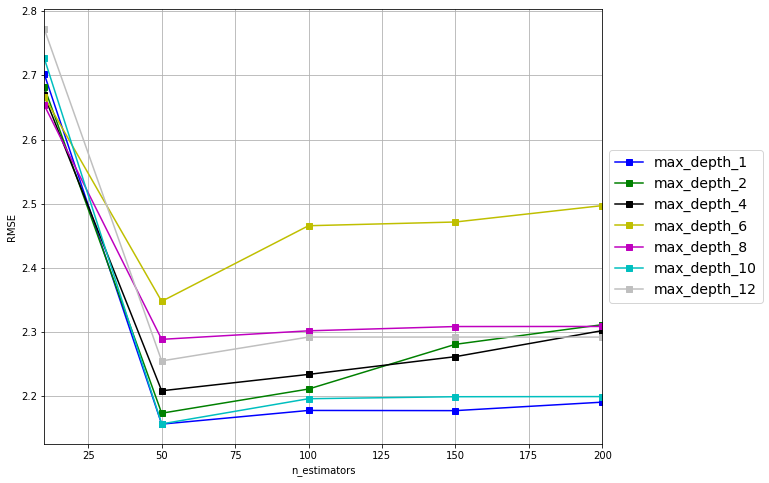

In [3615]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
# ax.set_ylim([0, 20])
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5)) # positions legend outside figure

In [3616]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
n_estimators_opt = temp['n_estimators'].values[0]
max_depth_opt = temp['max_depth'].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
n_estimators_opt, max_depth_opt

min RMSE = 2.157
optimum params = 


(50, 1)

In [3617]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp['n_estimators'].values[0], temp['max_depth'].values[0]

min MAPE = 1.889%
optimum params = 


(50, 10)

## Tuning learning_rate(default=0.1) and min_child_weight(default=1)

In [3618]:
param_label = 'learning_rate'
param_list = [0.01, 0.1, 0.2, 0.3]

param2_label = 'min_child_weight'
param2_list = [1]
param2_list.extend(range(10, 101, 50))

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _ = get_error_metrics(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              n_estimators=n_estimators_opt,
                                                              max_depth=max_depth_opt,
                                                              learning_rate=param,
                                                              min_child_weight=param2,
                                                              subsample=subsample,
                                                              colsample_bytree=colsample_bytree,
                                                              colsample_bylevel=colsample_bylevel,
                                                              gamma=gamma)
    
        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

Minutes taken = 3.06


,learning_rate,min_child_weight,rmse,mape,mae
0,0.01,1,3.880782,3.379544,3.389356
1,0.01,10,3.877870,3.375931,3.385341
2,0.01,60,3.884929,3.384996,3.394192
3,0.10,1,2.156787,1.911170,1.895061
4,0.10,10,2.124064,1.875548,1.861644
5,0.10,60,2.112312,1.863041,1.846515
6,0.20,1,2.179978,1.927901,1.910746
7,0.20,10,2.114358,1.867135,1.853178
8,0.20,60,2.142559,1.892429,1.872473
9,0.30,1,2.206750,1.960949,1.941608


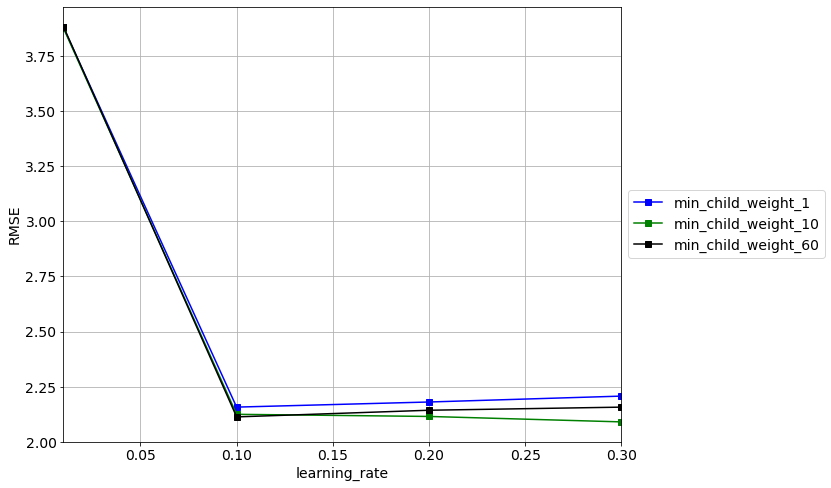

In [3619]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
# ax.set_ylim([0, 4])
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5)) # positions legend outside figure

In [3620]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
learning_rate_opt = temp['learning_rate'].values[0]
min_child_weight_opt = temp['min_child_weight'].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
learning_rate_opt, min_child_weight_opt

min RMSE = 2.090
optimum params = 


(0.3, 10)

In [3621]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp['learning_rate'].values[0], temp['min_child_weight'].values[0]

min MAPE = 1.848%
optimum params = 


(0.3, 10)

## Tuning XGBoost - subsample(default=1) and gamma(default=0)

In [3622]:
param_label = 'subsample'
param_list = [0.1, 0.5, 1]

param2_label = 'gamma'
param2_list = [0, 1, 4, 6, 8, 10]

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _ = get_error_metrics(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              n_estimators=n_estimators_opt,
                                                              max_depth=max_depth_opt,
                                                              learning_rate=learning_rate_opt,
                                                              min_child_weight=min_child_weight_opt,
                                                              subsample=param,
                                                              colsample_bytree=colsample_bytree,
                                                              colsample_bylevel=colsample_bylevel,
                                                              gamma=param2)

        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

Minutes taken = 4.25


,subsample,gamma,rmse,mape,mae
0,0.1,0,2.187786,1.950545,1.930154
1,0.1,1,2.187786,1.950545,1.930154
2,0.1,4,2.250373,1.968241,1.951048
3,0.1,6,2.290468,2.004555,1.996145
4,0.1,8,2.296408,2.013473,1.992924
5,0.1,10,2.168006,1.893186,1.880948
6,0.5,0,2.236057,1.976935,1.964069
7,0.5,1,2.236057,1.976935,1.964069
8,0.5,4,2.254056,2.006226,1.987889
9,0.5,6,2.329490,2.074894,2.058911


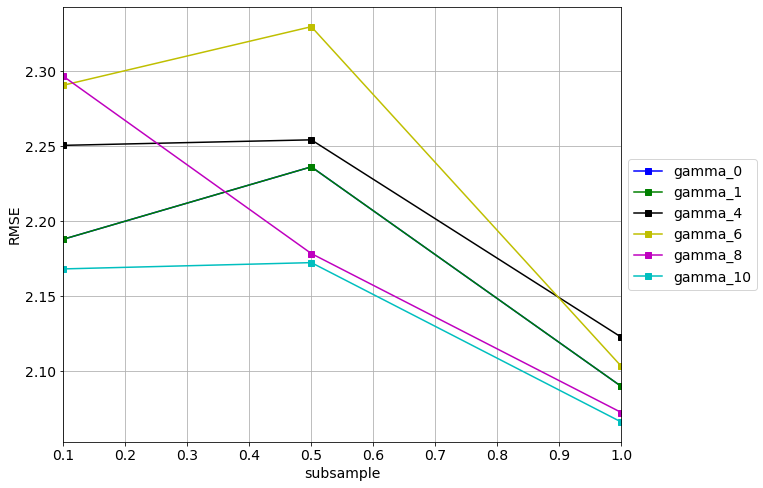

In [3623]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5)) # positions legend outside figure

In [3624]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
subsample_opt = temp['subsample'].values[0]
gamma_opt = temp['gamma'].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
subsample_opt, gamma_opt

min RMSE = 2.066
optimum params = 


(1.0, 10)

In [3625]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp['subsample'].values[0], temp['gamma'].values[0]

min MAPE = 1.810%
optimum params = 


(1.0, 10)

## Tuning colsample_bytree(default=1) and colsample_bylevel(default=1)

In [3626]:
param_label = 'colsample_bytree'
param_list = [0.5, 0.6, 0.7, 0.8, 0.9, 1]

param2_label = 'colsample_bylevel'
param2_list = [0.5, 0.6, 0.7, 0.8, 0.9, 1]

error_rate = defaultdict(list)

tic = time.time()
for param in tqdm_notebook(param_list):    
    for param2 in param2_list:
        rmse_mean, mape_mean, mae_mean, _, _, _ = get_error_metrics(train_val,
                                                              train_size,
                                                              'daily_ret',
                                                              N_opt,
                                                              tech_indicators,
                                                              H,
                                                              seed=model_seed,
                                                              n_estimators=n_estimators_opt,
                                                              max_depth=max_depth_opt,
                                                              learning_rate=learning_rate_opt,
                                                              min_child_weight=min_child_weight_opt,
                                                              subsample=subsample_opt,
                                                              colsample_bytree=param,
                                                              colsample_bylevel=param2,
                                                              gamma=gamma_opt)

    
        # Collect results
        error_rate[param_label].append(param)
        error_rate[param2_label].append(param2)
        error_rate['rmse'].append(rmse_mean)
        error_rate['mape'].append(mape_mean)
        error_rate['mae'].append(mae_mean)
    
error_rate = pd.DataFrame(error_rate)
toc = time.time()
print("Minutes taken = {0:.2f}".format((toc-tic)/60.0))

error_rate   

Minutes taken = 8.23


,colsample_bytree,colsample_bylevel,rmse,mape,mae
0,0.5,0.5,2.074679,1.819444,1.812810
1,0.5,0.6,2.074676,1.819165,1.811843
2,0.5,0.7,2.074675,1.819165,1.811842
3,0.5,0.8,2.069281,1.813982,1.807550
4,0.5,0.9,2.069281,1.813982,1.807550
5,0.5,1.0,2.071249,1.813774,1.807239
6,0.6,0.5,2.068897,1.811947,1.805452
7,0.6,0.6,2.069518,1.812523,1.806014
8,0.6,0.7,2.077770,1.819694,1.812779
9,0.6,0.8,2.077770,1.819694,1.812779


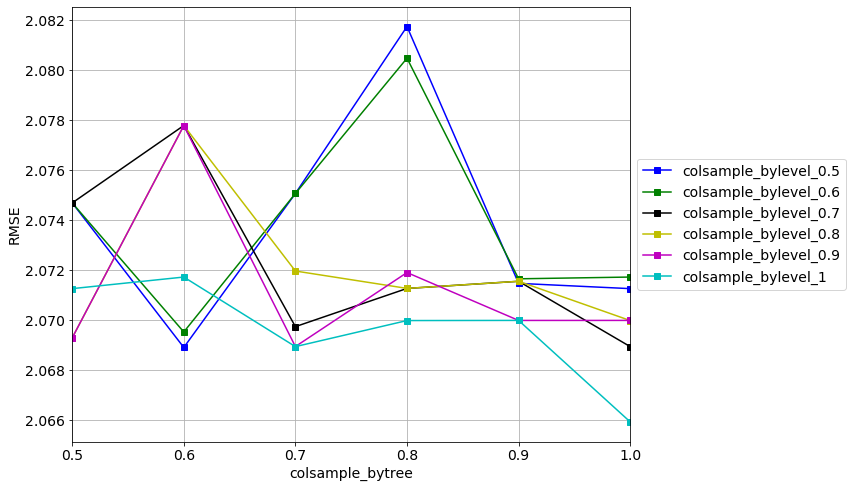

In [3627]:
# Plot performance versus params
rcParams['figure.figsize'] = 10, 8 # width 10, height 8
temp = error_rate[error_rate[param2_label]==param2_list[0]]
ax = temp.plot(x=param_label, y='rmse', style='bs-', grid=True)
legend_list = [param2_label + '_' + str(param2_list[0])]

color_list = ['r', 'g', 'k', 'y', 'm', 'c', '0.75']
for i in range(1,len(param2_list)):
    temp = error_rate[error_rate[param2_label]==param2_list[i]]
    ax = temp.plot(x=param_label, y='rmse', color=color_list[i%len(color_list)], marker='s', grid=True, ax=ax)
    legend_list.append(param2_label + '_' + str(param2_list[i]))

ax.set_xlabel(param_label)
ax.set_ylabel("RMSE")
matplotlib.rcParams.update({'font.size': 14})
plt.legend(legend_list, loc='center left', bbox_to_anchor=(1.0, 0.5)) # positions legend outside figure

In [3628]:
# Get optimum value for param and param2, using RMSE
temp = error_rate[error_rate['rmse'] == error_rate['rmse'].min()]
colsample_bytree_opt = temp['colsample_bytree'].values[0]
colsample_bylevel_opt = temp['colsample_bylevel'].values[0]
print("min RMSE = %0.3f" % error_rate['rmse'].min())
print("optimum params = ")
colsample_bytree_opt, colsample_bylevel_opt

min RMSE = 2.066
optimum params = 


(1.0, 1.0)

In [3629]:
# Get optimum value for param and param2, using MAPE
temp = error_rate[error_rate['mape'] == error_rate['mape'].min()]
print("min MAPE = %0.3f%%" % error_rate['mape'].min())
print("optimum params = ")
temp['colsample_bytree'].values[0], temp['colsample_bylevel'].values[0]

min MAPE = 1.810%
optimum params = 


(1.0, 1.0)

## Final model

In [3630]:
# Get error metrics on validation set after hyperparameter tuning
rmse_aft_tuning, mape_aft_tuning, mae_aft_tuning, preds_dict, _, _ = \
                                                      get_error_metrics(train_val,
                                                                        train_size,
                                                                        'daily_ret',
                                                                        N_opt,
                                                                        tech_indicators,
                                                                        H,
                                                                        seed=model_seed,
                                                                        n_estimators=n_estimators_opt,
                                                                        max_depth=max_depth_opt,
                                                                        learning_rate=learning_rate_opt,
                                                                        min_child_weight=min_child_weight_opt,
                                                                        subsample=subsample_opt,
                                                                        colsample_bytree=colsample_bytree_opt,
                                                                        colsample_bylevel=colsample_bylevel_opt,
                                                                        gamma=gamma_opt)
print("RMSE = %0.3f" % rmse_aft_tuning)
print("MAPE = %0.3f%%" % mape_aft_tuning)
print("MAE = %0.3f" % mae_aft_tuning)

RMSE = 2.066
MAPE = 1.810%
MAE = 1.804


In [3631]:
# Plot validation predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))

# Plot the predictions
n = 0
for key in preds_dict:
    fig.add_trace(go.Scatter(x=train_val[key:key+H]['date'], 
                             y=preds_dict[key],
                             mode='lines',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))
fig.update_xaxes(range=[val['date'].min(), val['date'].max()])
fig.update_yaxes(range=[val['adj_close'].min(), val['adj_close'].max()])
py.iplot(fig, filename='StockReturnsPrediction_v6_xgboost_val_aft_tune')

In [3632]:
# Do prediction on test set
test_rmse_aft_tuning, test_mape_aft_tuning, test_mae_aft_tuning, preds_dict, feature_importances, features = \
                                            get_error_metrics(df[pred_day-train_val_size:pred_day+H],
                                                                       train_size+val_size,
                                                                       'daily_ret',
                                                                       N_opt,
                                                                       tech_indicators,
                                                                       H,
                                                                       seed=model_seed,
                                                                       n_estimators=n_estimators_opt,
                                                                       max_depth=max_depth_opt,
                                                                       learning_rate=learning_rate_opt,
                                                                       min_child_weight=min_child_weight_opt,
                                                                       subsample=subsample_opt,
                                                                       colsample_bytree=colsample_bytree_opt,
                                                                       colsample_bylevel=colsample_bylevel_opt,
                                                                       gamma=gamma_opt)


print("RMSE = %0.3f" % test_rmse_aft_tuning)
print("MAPE = %0.3f%%" % test_mape_aft_tuning)
print("MAE = %0.3f" % test_mae_aft_tuning)

RMSE = 0.730
MAPE = 0.536%
MAE = 0.607


In [3633]:
# Plot test predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['date'], 
                         y=train['adj_close'],
                         mode='lines',
                         name='train',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=val['date'], 
                         y=val['adj_close'],
                         mode='lines',
                         name='validation',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=test['date'], 
                         y=test['adj_close'],
                         mode='lines',
                         name='test',
                         line=dict(color='green')))
fig.add_trace(go.Scatter(x=test[:H]['date'], 
                         y=preds_dict[list(preds_dict.keys())[0]],
                         mode='lines',
                         name='predictions',
                         line=dict(color='red')))
fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))

In [3634]:
# View a list of the features and their importance scores
imp = list(zip(features, feature_importances))
imp.sort(key=lambda tup: tup[1], reverse=False) 
imp

[('daily_ret_lag_10', 0.0),
 ('daily_ret_lag_9', 0.0),
 ('daily_ret_lag_8', 0.0),
 ('daily_ret_lag_7', 0.0),
 ('daily_ret_lag_6', 0.0),
 ('daily_ret_lag_5', 0.0),
 ('daily_ret_lag_3', 0.0),
 ('daily_ret_lag_2', 0.0),
 ('daily_ret_lag_1', 0.0),
 ('sma_above20_lag_1', 0.0),
 ('sma_above50_lag_1', 0.0),
 ('sma_above100_lag_1', 0.0),
 ('sma_above200_lag_1', 0.0),
 ('sma_10above20_lag_1', 0.0),
 ('sma_10above50_lag_1', 0.0),
 ('sma_10above100_lag_1', 0.0),
 ('sma_10above200_lag_1', 0.0),
 ('sma_cut20_lag_1', 0.0),
 ('sma_cut50_lag_1', 0.0),
 ('sma_cut100_lag_1', 0.0),
 ('sma_cut200_lag_1', 0.0),
 ('sma_10cut20_lag_1', 0.0),
 ('sma_10cut50_lag_1', 0.0),
 ('sma_10cut100_lag_1', 0.0),
 ('sma_10cut200_lag_1', 0.0),
 ('sma_cut20down_lag_1', 0.0),
 ('sma_cut50down_lag_1', 0.0),
 ('sma_cut100down_lag_1', 0.0),
 ('sma_cut200down_lag_1', 0.0),
 ('sma_10cut20down_lag_1', 0.0),
 ('sma_10cut50down_lag_1', 0.0),
 ('sma_10cut100down_lag_1', 0.0),
 ('sma_10cut200down_lag_1', 0.0),
 ('ema_above20_lag_1', 0

In [3635]:
# Plot the importance scores as a bar chart
fig = go.Figure(go.Bar(
            x=[item[1] for item in imp[-10:]],
            y=[item[0] for item in imp[-10:]],
            orientation='h'))
py.iplot(fig, filename='StockReturnsPrediction_v6_xgboost_imp_scores')

## Tuned params

In [3636]:
# Tuned params and before and after error metrics
d = {'param': ['n_estimators', 'max_depth', 'learning_rate', 'min_child_weight', 'subsample', 'colsample_bytree', 'colsample_bylevel', 'gamma', 'val_rmse', 'val_mape', 'val_mae'],
     'before_tuning': [n_estimators, max_depth, learning_rate, min_child_weight, subsample, colsample_bytree, colsample_bylevel, gamma, rmse_bef_tuning, mape_bef_tuning, mae_bef_tuning],
     'after_tuning': [n_estimators_opt, max_depth_opt, learning_rate_opt, min_child_weight_opt, subsample_opt, colsample_bytree_opt, colsample_bylevel_opt, gamma_opt, rmse_aft_tuning, mape_aft_tuning, mae_aft_tuning]}
tuned_params = pd.DataFrame(d)
tuned_params = tuned_params.round(3)
tuned_params

,param,before_tuning,after_tuning
0,n_estimators,100.000,50.000
1,max_depth,3.000,1.000
2,learning_rate,0.100,0.300
3,min_child_weight,1.000,10.000
4,subsample,1.000,1.000
5,colsample_bytree,1.000,1.000
6,colsample_bylevel,1.000,1.000
7,gamma,0.000,10.000
8,val_rmse,2.261,2.066
9,val_mape,2.002,1.810


In [3637]:
# Put tuned_params into pickle
pickle.dump(tuned_params, open("./out/v6_tuned_params_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))

In [3638]:
toc1 = time.time()
print("Total minutes taken = {0:.2f}".format((toc1-tic1)/60.0))

Total minutes taken = 65.87


# Findings for a specific date

In [3639]:
print("Predicting on day %d, date %s, with forecast horizon H = %d" % (pred_day, df.iloc[pred_day]['date'].strftime("%Y-%m-%d"), H))

Predicting on day 1008, date 2017-01-03, with forecast horizon H = 21


In [3640]:
rmse_bef_tuning, rmse_aft_tuning

(2.2609356445224487, 2.0659221138116783)

In [3641]:
test_rmse_bef_tuning, test_rmse_aft_tuning

(1.1409060913273947, 0.7302441702397073)

In [3642]:
# Put results into pickle
pickle.dump(rmse_bef_tuning, open("./out/v6_val_rmse_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(rmse_aft_tuning, open("./out/v6_val_rmse_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_rmse_bef_tuning, open("./out/v6_test_rmse_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mape_bef_tuning, open("./out/v6_test_mape_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mae_bef_tuning, open("./out/v6_test_mae_bef_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_rmse_aft_tuning, open("./out/v6_test_rmse_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mape_aft_tuning, open("./out/v6_test_mape_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(test_mae_aft_tuning, open("./out/v6_test_mae_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))
pickle.dump(preds_dict[list(preds_dict.keys())[0]], open("./out/v6_test_est_aft_tuning_" + df.iloc[pred_day]['date'].strftime("%Y-%m-%d") + ".pickle", "wb"))

# Findings across all dates

In [3643]:
# Consolidate results
# H = 21                         # Forecast horizon, in days. Note there are about 252 trading days in a year
# train_size = 252*3             # Use 3 years of data as train set. Note there are about 252 trading days in a year
# val_size = 252                 # Use 1 year of data as validation set
# N = 10                          # for feature at day t, we use lags from t-1, t-2, ..., t-N as features
results = defaultdict(list)
ests = {} # the predictions
date_list = ['2017-01-03',
             '2017-03-06',
             '2017-05-04',
             '2017-07-05',
             '2017-09-01',
             '2017-11-01',
             '2018-01-03',
             '2018-03-06',
             '2018-05-04',
             '2018-07-05',
             '2018-09-04',
             '2018-11-01'
            ]
for date in date_list:
    results['date'].append(date)
    results['val_rmse_bef_tuning'].append(pickle.load(open( "./out/v6_val_rmse_bef_tuning_" + date + ".pickle", "rb")))
    results['val_rmse_aft_tuning'].append(pickle.load(open( "./out/v6_val_rmse_aft_tuning_" + date + ".pickle", "rb")))
    results['test_rmse_bef_tuning'].append(pickle.load(open( "./out/v6_test_rmse_bef_tuning_" + date + ".pickle", "rb")))
    results['test_rmse_aft_tuning'].append(pickle.load(open( "./out/v6_test_rmse_aft_tuning_" + date + ".pickle", "rb")))
    results['test_mape_bef_tuning'].append(pickle.load(open( "./out/v6_test_mape_bef_tuning_" + date + ".pickle", "rb")))
    results['test_mape_aft_tuning'].append(pickle.load(open( "./out/v6_test_mape_aft_tuning_" + date + ".pickle", "rb")))
    results['test_mae_bef_tuning'].append(pickle.load(open( "./out/v6_test_mae_bef_tuning_" + date + ".pickle", "rb")))
    results['test_mae_aft_tuning'].append(pickle.load(open( "./out/v6_test_mae_aft_tuning_" + date + ".pickle", "rb")))
    ests[date] = pickle.load(open( "./out/v6_test_est_aft_tuning_" + date + ".pickle", "rb"))
    
results = pd.DataFrame(results)
results

,date,val_rmse_bef_tuning,val_rmse_aft_tuning,test_rmse_bef_tuning,test_rmse_aft_tuning,test_mape_bef_tuning,test_mape_aft_tuning,test_mae_bef_tuning,test_mae_aft_tuning
0,2017-01-03,2.260936,2.065922,1.140906,0.730244,0.891917,0.536398,1.009248,0.606934
1,2017-03-06,2.006806,1.611054,1.167792,1.181771,0.818004,0.858733,0.955786,1.003270
2,2017-05-04,1.790775,1.557564,0.987867,0.903922,0.652092,0.640284,0.780177,0.765772
3,2017-07-05,1.735471,1.398000,1.528741,1.167430,1.102957,0.851204,1.357803,1.047647
4,2017-09-01,1.533739,1.305922,1.078424,1.142938,0.786637,0.824307,0.985771,1.032977
5,2017-11-01,1.626150,1.393937,1.033641,0.926697,0.559264,0.491009,0.733224,0.643734
6,2018-01-03,1.740505,1.410932,4.598887,4.636036,3.022049,3.011772,4.269339,4.257178
7,2018-03-06,2.226330,1.901863,4.704210,3.727059,2.719102,2.268824,3.634739,3.048246
8,2018-05-04,2.360640,2.065035,2.896473,3.455917,2.013711,2.420322,2.786233,3.348458
9,2018-07-05,2.693429,2.299365,3.296205,3.266007,2.192229,2.210102,3.146303,3.170329


In [3644]:
# Generate a condensed dataframe of the above
results_short = defaultdict(list)
hyperparam_list = ['n_estimators', 
                   'max_depth', 
                   'learning_rate', 
                   'min_child_weight',
#                    'subsample',
#                    'colsample_bytree',
#                    'colsample_bylevel',
#                    'gamma'
                  ]

for date in date_list:
    results_short['date'].append(date)
    results_short['RMSE'].append(pickle.load(open( "./out/v6_test_rmse_aft_tuning_" + date + ".pickle", "rb")))
    results_short['MAPE(%)'].append(pickle.load(open( "./out/v6_test_mape_aft_tuning_" + date + ".pickle", "rb")))
    results_short['MAE'].append(pickle.load(open( "./out/v6_test_mae_aft_tuning_" + date + ".pickle", "rb")))
    
    tuned_params = pickle.load(open("./out/v6_tuned_params_" + date + ".pickle", "rb"))
    for hyperparam in hyperparam_list:
        results_short[hyperparam].append(tuned_params[tuned_params['param']==hyperparam]['after_tuning'].values[0])

    
results_short = pd.DataFrame(results_short)
results_short

,date,RMSE,MAPE(%),MAE,n_estimators,max_depth,learning_rate,min_child_weight
0,2017-01-03,0.730244,0.536398,0.606934,50.0,1.0,0.3,10.0
1,2017-03-06,1.181771,0.858733,1.003270,200.0,1.0,0.1,10.0
2,2017-05-04,0.903922,0.640284,0.765772,50.0,2.0,0.1,10.0
3,2017-07-05,1.167430,0.851204,1.047647,50.0,2.0,0.1,1.0
4,2017-09-01,1.142938,0.824307,1.032977,50.0,1.0,0.1,1.0
5,2017-11-01,0.926697,0.491009,0.643734,50.0,1.0,0.1,1.0
6,2018-01-03,4.636036,3.011772,4.257178,50.0,1.0,0.1,1.0
7,2018-03-06,3.727059,2.268824,3.048246,50.0,1.0,0.1,1.0
8,2018-05-04,3.455917,2.420322,3.348458,50.0,1.0,0.1,10.0
9,2018-07-05,3.266007,2.210102,3.170329,50.0,1.0,0.1,60.0


In [3645]:
results.mean()

val_rmse_bef_tuning     2.167830
val_rmse_aft_tuning     1.870309
test_rmse_bef_tuning    2.218572
test_rmse_aft_tuning    2.042136
test_mape_bef_tuning    1.444498
test_mape_aft_tuning    1.343281
test_mae_bef_tuning     1.940787
test_mae_aft_tuning     1.813523
dtype: float64

In [3646]:
# Plot all predictions
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['date'], 
                         y=df['adj_close'],
                         mode='lines',
                         name='adj_close',
                         line=dict(color='blue')))

# Plot the predictions
n = 0
for key in ests:
    i = df[df['date']==key].index[0]
    fig.add_trace(go.Scatter(x=df[i:i+H]['date'], 
                             y=ests[key],
                             mode='lines',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.update_layout(yaxis=dict(title='USD'),
                  xaxis=dict(title='date'))
fig.update_xaxes(range=['2017-01-03', '2018-12-28'])
fig.update_yaxes(range=[110, 150])
py.iplot(fig, filename='StockPricePrediction_v6_xgboost_predictions')

In [3647]:
# Plot scatter plot of actual values vs. predictions
fig = go.Figure()

n = 0
for key in ests:
    i = df[df['date']==key].index[0]
    fig.add_trace(go.Scatter(x=df[i:i+H]['adj_close'], 
                             y=ests[key],
                             mode='markers',
                             name='predictions',
                             line=dict(color=colors[n%len(colors)])))
    n = n + 1

fig.add_trace(go.Scatter(x=list(range(110, 155, 1)),
                         y=list(range(110, 155, 1)),
                         mode='lines',
                         name='actual values',
                         line=dict(color='blue')))

fig.update_layout(yaxis=dict(title='forecasts'),
                  xaxis=dict(title='adj_close'))
py.iplot(fig, filename='StockPricePrediction_v6_xgboost_actuals_vs_predictions')

In [3654]:
# Compare results with benchmark
all_results = pd.DataFrame({'Method': ['Last value',  
                                       'XGBoost w/o date features', 
                                       'XGBoost w date features', 
                                       'XGBoost w/o date features, w technical indicators',
                                       'XGBoost w/o date features, w technical indicators and direct forecasting'],
                            'RMSE': [2.53, 2.33, 2.37, 2.38, 2.04],
                            'MAPE(%)': [1.69, 1.55, 1.61, 1.59, 1.34],
                            'MAE': [2.26, 2.08, 2.11, 2.12, 1.81]})

with pd.option_context('max_colwidth', -1): # make sure the whole string in Method is printed out
    display(all_results)

,Method,RMSE,MAPE(%),MAE
0,Last value,2.53,1.69,2.26
1,XGBoost w/o date features,2.33,1.55,2.08
2,XGBoost w date features,2.37,1.61,2.11
3,"XGBoost w/o date features, w technical indicators",2.38,1.59,2.12
4,"XGBoost w/o date features, w technical indicators and direct forecasting",2.04,1.34,1.81
